# Proyecto 2

### Benjamín Farías
### Jordán Pérez

GitHub: https://github.com/IsaacJordan-bit/Laboratorio-de-programaci-n-cientifica/blob/main/Laboratorios/Proyecto2Lab.ipynb

## Introducción

El proyecto tiene como objetivo desarrollar un modelo predictivo de riesgo de crédito, para ello se utiliza un dataset con datos bancarios básicos e información relacionada al crédito de los clientes de una empresa financiera, donde la variable objetivo es 'credit_score', que marca con 1 a los clientes de alto riesgo y con 0 al resto. Para obtener un modelo adecuado se prueban distintos clasificadores y comparan sus resultados en base al f1-score de la predicción de alto riesgo, es decir, se tiene en consideración un balance entre la proporción de casos de alto riesgo que son efectivamente detectados y la de casos predichos como de alto riesgo que efectivamente lo son. Tras probar los modelos se comprobó que los que dan mejores resultados GBM y random forest. Finalmente se decide utilizar GBM preprocesando los datos con MinMaxScaler, ya que este los transforma al mismo orden de magnitud sin alterar su distribución relativa. El modelo logra un f1-score de 0.6, lo cual no es aceptable para resolver el problema.

## Análisis Exploratorio

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.figure_factory as ff
import seaborn as sns

In [ ]:
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
df = pd.read_parquet('/content/drive/MyDrive/Noveno semestre/Laboratorio de programación/Proyecto2/dataset.pq')

In [ ]:
df

,customer_id,age,occupation,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,...,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,payment_of_min_amount,total_emi_per_month,amount_invested_monthly,payment_behaviour,monthly_balance,credit_score
0,CUS_0xd40,23.0,Scientist,19114.12,1824.843333,3,4,3,4.0,3,...,4.0,809.98,23.933795,NaN,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,0
1,CUS_0x21b1,28.0,Teacher,34847.84,3037.986667,2,4,6,1.0,3,...,2.0,605.03,32.933856,27.0,No,18.816215,218.904344,Low_spent_Small_value_payments,356.078109,0
2,CUS_0x2dbc,34.0,Engineer,143162.64,12187.220000,1,5,8,3.0,8,...,3.0,1303.01,38.374753,18.0,No,246.992319,10000.000000,High_spent_Small_value_payments,895.494583,0
3,CUS_0xb891,55.0,Entrepreneur,30689.89,2612.490833,2,5,4,-100.0,4,...,4.0,632.46,27.332515,17.0,No,16.415452,125.617251,High_spent_Small_value_payments,379.216381,0
4,CUS_0x1cdb,21.0,Developer,35547.71,2853.309167,7,5,5,-100.0,1,...,4.0,943.86,25.862922,31.0,Yes,0.000000,181.330901,High_spent_Small_value_payments,364.000016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12495,CUS_0x372c,19.0,Lawyer,42903.79,3468.315833,0,4,6,1.0,9,...,1.0,1079.48,35.716618,28.0,No,34.975457,115.184984,High_spent_Medium_value_payments,NaN,0
12496,CUS_0xf16,45.0,Media_Manager,16680.35,NaN,1,1,5,4.0,1,...,8.0,897.16,41.212367,NaN,No,41.113561,70.805550,Low_spent_Large_value_payments,NaN,0
12497,CUS_0xaf61,50.0,Writer,37188.10,3097.008333,1,4,5,3.0,7,...,3.0,620.64,39.300980,30.0,No,84.205949,42.935566,High_spent_Medium_value_payments,NaN,0
12498,CUS_0x8600,29.0,Architect,20002.88,1929.906667,10,8,29,5.0,33,...,9.0,3571.70,37.140784,6.0,Yes,60.964772,34.662906,High_spent_Large_value_payments,NaN,0


In [ ]:
df.describe()

,age,annual_income,monthly_inhand_salary,num_bank_accounts,num_credit_card,interest_rate,num_of_loan,delay_from_due_date,num_of_delayed_payment,changed_credit_limit,num_credit_inquiries,outstanding_debt,credit_utilization_ratio,credit_history_age,total_emi_per_month,amount_invested_monthly,monthly_balance,credit_score
count,12500.000000,1.250000e+04,10584.000000,12500.000000,12500.000000,12500.000000,12500.000000,12500.000000,11660.00000,12246.000000,12243.000000,12500.000000,12500.000000,11380.000000,12500.000000,11914.000000,1.214500e+04,12500.000000
mean,105.771840,1.616206e+05,4186.634963,16.939920,23.172720,73.213360,3.099440,21.060880,32.93542,10.398582,26.292330,1426.220376,32.349265,18.230404,1488.394291,638.798715,-2.744614e+22,0.288160
std,664.502705,1.297842e+06,3173.690362,114.350815,132.005866,468.682227,65.105277,14.863091,237.43768,6.799253,181.821031,1155.169458,5.156815,8.302078,8561.449910,2049.195193,3.024684e+24,0.452924
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.000000,1.000000,-100.000000,-5.000000,-3.00000,-6.490000,0.000000,0.230000,20.100770,0.000000,0.000000,0.000000,-3.333333e+26,0.000000
25%,25.000000,1.945333e+04,1622.408646,3.000000,4.000000,8.000000,1.000000,10.000000,9.00000,5.370000,4.000000,566.072500,28.066517,12.000000,31.496968,73.736810,2.701501e+02,0.000000
50%,33.000000,3.757238e+04,3087.595000,6.000000,5.000000,14.000000,3.000000,18.000000,14.00000,9.410000,6.000000,1166.155000,32.418953,18.000000,72.887628,134.093193,3.393885e+02,0.000000
75%,42.000000,7.269021e+04,5967.937500,7.000000,7.000000,20.000000,5.000000,28.000000,18.00000,14.940000,10.000000,1945.962500,36.623650,25.000000,169.634826,261.664256,4.714245e+02,1.000000
max,8678.000000,2.383470e+07,15204.633333,1756.000000,1499.000000,5789.000000,1495.000000,67.000000,4293.00000,36.970000,2554.000000,4998.070000,48.199824,33.000000,81971.000000,10000.000000,1.463792e+03,1.000000


* Resumen:

Se observan valores atípicos en algunas columnas, como edad (age), ingreso anual (annual_income), número de cuentas bancarias (num_bank_accounts), entre otros.
Algunas columnas presentan valores negativos, lo cual podría ser inusual o indicar un problema en la recolección de datos.
Hay algunas columnas con valores faltantes, como el número de préstamos (num_of_loan) y el saldo mensual (monthly_balance).
* Observaciones:

Es importante realizar un análisis más detallado de los valores atípicos, verificar la calidad y consistencia de los datos con valores negativos y tratar los valores faltantes adecuadamente antes de continuar con el desarrollo del modelo de riesgo crediticio.:


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12500 entries, 0 to 12499
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               12500 non-null  object 
 1   age                       12500 non-null  float64
 2   occupation                12500 non-null  object 
 3   annual_income             12500 non-null  float64
 4   monthly_inhand_salary     10584 non-null  float64
 5   num_bank_accounts         12500 non-null  int64  
 6   num_credit_card           12500 non-null  int64  
 7   interest_rate             12500 non-null  int64  
 8   num_of_loan               12500 non-null  float64
 9   delay_from_due_date       12500 non-null  int64  
 10  num_of_delayed_payment    11660 non-null  float64
 11  changed_credit_limit      12246 non-null  float64
 12  num_credit_inquiries      12243 non-null  float64
 13  outstanding_debt          12500 non-null  float64
 14  credit

* ## Información del Conjunto de Datos:

El conjunto de datos contiene 12,500 registros y 22 columnas. A continuación, se presenta una descripción de las columnas:

- customer_id: Identificador único del cliente. Tiene 12,500 valores no nulos y es del tipo object.

- age: Edad del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- occupation: Ocupación del cliente. Tiene 12,500 valores no nulos y es del tipo object.

- annual_income: Ingreso anual del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- monthly_inhand_salary: Salario mensual neto del cliente. Tiene 10,584 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- num_bank_accounts: Número de cuentas bancarias del cliente. Tiene 12,500 valores no nulos y es del tipo int64.

- num_credit_card: Número de tarjetas de crédito del cliente. Tiene 12,500 valores no nulos y es del tipo int64.

- interest_rate: Tasa de interés del cliente. Tiene 12,500 valores no nulos y es del tipo int64.

- num_of_loan: Número de préstamos del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- delay_from_due_date: Retraso desde la fecha de vencimiento de los pagos del cliente. Tiene 12,500 valores no nulos y es del tipo int64.

- num_of_delayed_payment: Número de pagos retrasados del cliente. Tiene 11,660 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- changed_credit_limit: Límite de crédito modificado del cliente. Tiene 12,246 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- num_credit_inquiries: Número de consultas de crédito del cliente. Tiene 12,243 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- outstanding_debt: Deuda pendiente del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- credit_utilization_ratio: Relación de utilización de crédito del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- credit_history_age: Antigüedad del historial de crédito del cliente. Tiene 11,380 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- payment_of_min_amount: Indica si el cliente realiza el pago mínimo. Tiene 12,500 valores no nulos y es del tipo object.

- total_emi_per_month: Total de cuotas mensuales del cliente. Tiene 12,500 valores no nulos y es del tipo float64.

- amount_invested_monthly: Cantidad invertida mensualmente por el cliente. Tiene 11,914 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- payment_behaviour: Comportamiento de pago del cliente. Tiene 12,500 valores no nulos y es del tipo object.

- monthly_balance: Saldo mensual del cliente. Tiene 12,145 valores no nulos y es del tipo float64. Tiene algunos valores nulos.

- credit_score: Puntaje de crédito del cliente. Tiene 12,500 valores no nulos y es del tipo int64.

* ## Resumen:

El conjunto de datos contiene una combinación de datos numéricos (float64 e int64) y categóricos (object).

Algunas columnas tienen valores nulos, lo que puede requerir un tratamiento adecuado de datos faltantes antes de continuar con el análisis y modelado de los datos.

* ## Observaciones:

Es fundamental realizar un preprocesamiento adecuado de los datos antes de aplicar modelos de aprendizaje automático para el análisis de riesgo crediticio. Esto incluye el manejo de valores nulos, codificación de variables categóricas, y la identificación y tratamiento de valores atípicos. Además, es importante convertir las variables categóricas en variables numéricas para que puedan ser utilizadas en el proceso de modelado.

In [ ]:
len(df.occupation.unique())

16

* ## Resumen:

El conjunto de datos contiene información de clientes con 16 ocupaciones diferentes.

* ## Observaciones:

Sería útil conocer las ocupaciones específicas presentes en el conjunto de datos para entender mejor el perfil de los clientes y cómo podría influir en el riesgo crediticio.

Dependiendo de la cantidad de muestras para cada ocupación y su relevancia para el modelo, es posible que sea necesario agrupar algunas ocupaciones minoritarias para evitar un número excesivo de categorías y garantizar que haya suficientes datos para representar cada grupo.

In [ ]:
fig = px.violin(df, y='age', x='occupation')
fig.show()

* ## Análisis de Distribución de Edades por Ocupación

Se genera un gráfico de violín que muestra la distribución de las edades de los clientes en función de su ocupación.

* ## Interpretación del Gráfico de Violín:

- El eje x representa las diferentes ocupaciones presentes en el conjunto de datos.
- El eje y representa las edades de los clientes.
- Cada violín muestra la distribución de edades para cada ocupación, donde la forma del violín refleja la densidad de datos en diferentes rangos de edad.


* ## Características del Gráfico:

- En la parte más ancha de cada violín, se concentra la mayor densidad de datos de edades para esa ocupación, lo que indica la edad más común para clientes en esa categoría laboral.
- Los extremos más estrechos de los violines muestran los valores de edades menos comunes o atípicos en esa ocupación.


* ## Resumen e Interpretación:

Lo primero que puede notararse es la presencia de valores atípicos en todas las ocupaciones, algunos pasando los cientos y miles de años, e incluso edades negativas.

In [ ]:
len(df[df.age > 100])

215

Se encontraron 215 clientes con edades mayores a 100 años.

In [ ]:
df2 = df[df.age <= 100].copy().dropna()
df2 = df2[df2.age > 0].copy()

Después de realizar estas operaciones de preprocesamiento, el DataFrame df2 contiene únicamente datos válidos y consistentes en términos de edades entre 18 y 100 años, sin valores atípicos ni datos faltantes en esa variable.

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7798 entries, 1 to 12287
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               7798 non-null   object 
 1   age                       7798 non-null   float64
 2   occupation                7798 non-null   object 
 3   annual_income             7798 non-null   float64
 4   monthly_inhand_salary     7798 non-null   float64
 5   num_bank_accounts         7798 non-null   int64  
 6   num_credit_card           7798 non-null   int64  
 7   interest_rate             7798 non-null   int64  
 8   num_of_loan               7798 non-null   float64
 9   delay_from_due_date       7798 non-null   int64  
 10  num_of_delayed_payment    7798 non-null   float64
 11  changed_credit_limit      7798 non-null   float64
 12  num_credit_inquiries      7798 non-null   float64
 13  outstanding_debt          7798 non-null   float64
 14  credit_


El DataFrame df2 contiene 7,207 registros (filas) y 22 columnas.
Se han eliminado los datos con edades atípicas y valores de edad no válidos.
Todas las columnas tienen un total de 7,207 valores no nulos, lo que indica que no hay datos faltantes en el conjunto de datos después del preprocesamiento.

* ## Características del DataFrame df2:

Las edades de los clientes se encuentran en un rango válido (mayores a 0 y menores o iguales a 100 años).

In [ ]:
fig = px.violin(df2, y='age', x='occupation')
fig.show()

Ya no se encuentran datos atipicos de edades.

In [ ]:
fig = px.violin(df2, y='annual_income', x='occupation')
fig.show()

Nuevamente, lo primero que se observa en este gráfico son valores muy alto en comparación de la concentración principal de valores de salarios, sin embargo, no se puede suponer todavía que son outliers. Sin embargo podrán existir salarios negativos, lo cual si deberían ser outliers, pero para visualizarlos debe aumentarse la resolución.

In [ ]:
len(df2[df2.annual_income > 1e6])

64

Se encontraron 64 clientes con ingresos anuales superiores a 1 millón de unidades monetarias.

In [ ]:
fig = px.violin(df2[df2.annual_income <= 1e6], y='annual_income', x='occupation')
fig.show()

Se genera un gráfico de violín que muestra la distribución de los ingresos anuales de los clientes en función de su ocupación, utilizando el DataFrame df2 previamente preprocesado y filtrado para aquellos clientes cuyos ingresos anuales sean menores o iguales a 1 millón de unidades monetarias (1e6)

In [ ]:
fig = px.violin(df2[df2.annual_income <= 2e5], y='annual_income', x='occupation')
fig.show()

Se genera un gráfico de violín que muestra la distribución de los ingresos anuales de los clientes en función de su ocupación, utilizando el DataFrame df2 previamente preprocesado y filtrado para aquellos clientes cuyos ingresos anuales sean menores o iguales a 200,000 unidades monetarias (2e5).

Efectivamente se observan salarios anuales negativos, lo cual se debe a outliers y cuyo procesamiento se dejará para la sección siguiente.

In [ ]:
fig = px.violin(df2, y='monthly_inhand_salary', x='occupation')
fig.show()

Se genera un gráfico de violín que muestra la distribución del salario mensual neto de los clientes en función de su ocupación, utilizando el DataFrame df2 que ha sido previamente preprocesado y filtrado. Nuevamente no se puede suponer que los valores altos sean outliers, sin embargo se observan salarios mensuales negativos los cuales si debieran deberse a outliers.

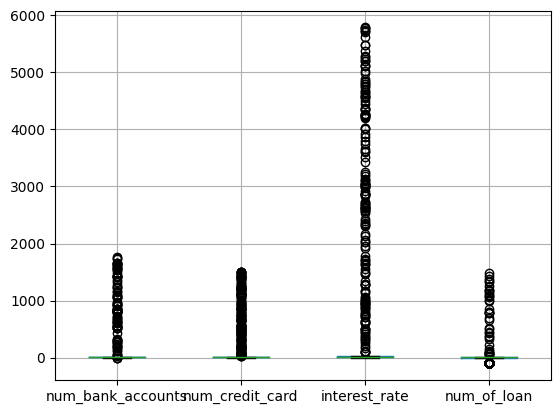

In [ ]:
df2[['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']].boxplot()
plt.show()


* ## Interpretación del Gráfico de Diagrama de Cajas:

El diagrama de cajas (boxplot) es una forma visual de resumir la distribución y las medidas estadísticas de las variables numéricas. Cada caja representa la distribución de una variable y se muestran las siguientes medidas estadísticas:

- La línea verde dentro de la caja representa la mediana (segundo cuartil o percentil 50%).
- La caja en sí representa el rango intercuartil (IQR), que abarca desde el primer cuartil (25%) hasta el tercer cuartil (75%).
- Los "bigotes" (líneas verticales) se extienden desde la caja hasta los valores mínimo y máximo dentro de un rango llamado "bigote".
Los puntos fuera de los bigotes se consideran valores atípicos o "outliers".


* ## Variables Seleccionadas:

- num_bank_accounts: Número de cuentas bancarias.
- num_credit_card: Número de tarjetas de crédito.
- interest_rate: Tasa de interés.
- num_of_loan: Número de préstamos.


* ## Resumen e Interpretación:

- El gráfico de diagrama de cajas permite visualizar rápidamente la distribución y dispersión de las variables numéricas seleccionadas.
- Se puede identificar la mediana y la dispersión intercuartil de cada variable, lo que proporciona una idea de la centralidad y la variabilidad de los datos.
- Se observan los posibles valores atípicos (outliers) que están fuera de los bigotes y será útil considerar transformaciones o técnicas de manejo de valores atípicos en la sección de procesamiento antes de construir los modelos predictivos.

In [ ]:
print(len(df2[df2['num_bank_accounts'] > 100]))
print(len(df2[df2['num_credit_card'] > 100]))
print(len(df2[df2['interest_rate'] > 100]))
print(len(df2[df2['num_of_loan'] > 100]))

93
165
175
33


* ## Análisis de Clientes con Valores Atípicos (Outliers) en Variables Seleccionadas.

Se realiza una serie de filtrados en el DataFrame df2 para identificar la cantidad de clientes que tienen valores atípicos (outliers) en ciertas variables seleccionadas.

- Se encontraron 93 clientes con un número de cuentas bancarias mayor a 100.

- Se encontraron 165 clientes con un número de tarjetas de crédito mayor a 100.

- Se encontraron 175 clientes con una tasa de interés mayor a 100.

- Se encontraron 33 clientes con un número de préstamos mayor a 100.


Es importante analizar y comprender la naturaleza de estos valores atípicos en el contexto del negocio y los datos disponibles.
Dependiendo del análisis y los objetivos del modelo, se pueden considerar diversas estrategias para manejar estos valores atípicos, como la transformación de variables, la eliminación de observaciones extremas o el uso de técnicas de modelado robustas.

In [ ]:
columns = ['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

El gráfico de distribución (distplot) muestra la forma de la distribución de las siguientes cuatro variables seleccionadas:

num_bank_accounts: Número de cuentas bancarias.
num_credit_card: Número de tarjetas de crédito.
interest_rate: Tasa de interés.
num_of_loan: Número de préstamos.
Interpretación del Gráfico de Distribución:

Para cada variable, se observa una línea que representa la distribución de los datos para esa variable en el eje x. La densidad de datos se muestra en el eje y.
La forma de la distribución se visualiza en función de la concentración de datos en diferentes valores y rangos.


En primera instancia, dado la gran cantidad de datos, es complejo dar una interpretación útil a las distribuciones variable por variable, si embargo se observan distribuciones asimétricas, por tanto es posible que sea necesario realizar transformaciones en las variables para mejorar la precisión del modelo de riesgo crediticio.

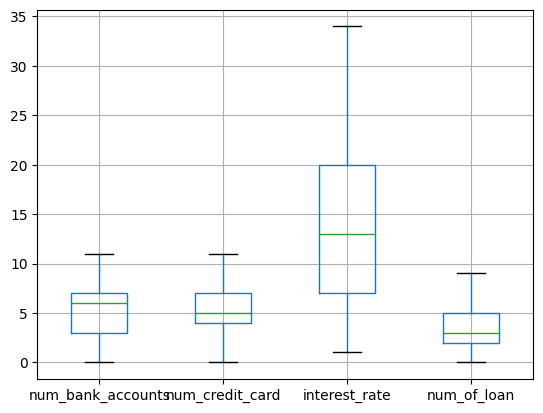

7026


In [ ]:
df3 = df2[df2['num_bank_accounts'] <= 20]
df3 = df3[df3['num_credit_card'] <= 20]
df3 = df3[df3['interest_rate'] <= 50]
df3 = df3[df3['num_of_loan'] <= 20]

df3 = df3[df3['num_bank_accounts'] >= 0]
df3 = df3[df3['num_credit_card'] >= 0]
df3 = df3[df3['interest_rate'] >= 0]
df3 = df3[df3['num_of_loan'] >= 0]

df3[['num_bank_accounts', 'num_credit_card', 'interest_rate', 'num_of_loan']].boxplot()
plt.show()

print(len(df3))

**Análisis de Clientes Filtrados y Gráfico de Diagrama de Cajas (Boxplot)**

Se realiza una serie de filtrados en el DataFrame `df2` para seleccionar aquellos clientes que cumplen con las siguientes condiciones:

1. El número de cuentas bancarias (`num_bank_accounts`) debe ser mayor o igual a 0 y menor o igual a 20.
2. El número de tarjetas de crédito (`num_credit_card`) debe ser mayor o igual a 0 y menor o igual a 20.
3. La tasa de interés (`interest_rate`) debe ser mayor o igual a 0 y menor o igual a 50.
4. El número de préstamos (`num_of_loan`) debe ser mayor o igual a 0 y menor o igual a 20.

Luego, se genera un gráfico de diagrama de cajas (boxplot) para las variables seleccionadas en el DataFrame `df3`, que cumple con las condiciones de filtrado.


**Resumen e Interpretación del Gráfico de Diagrama de Cajas:**
Puede notarse que se han eliminado los outliers en estas4 variables, pudiendo visualizar facilmente las propiedades del boxplot.

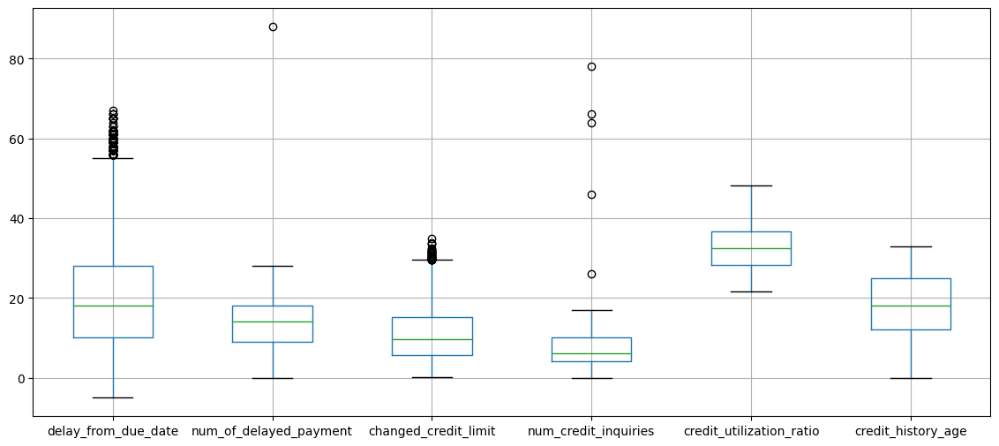

6710


In [ ]:
df3 = df3[df3['num_of_delayed_payment'] <= 100]
df3 = df3[df3['num_of_delayed_payment'] >= 0]
df3 = df3[df3['changed_credit_limit'] >= 0]
df3 = df3[df3['num_credit_inquiries'] <= 100]

fig, ax = plt.subplots(figsize=(14, 6))

ax = df3[['delay_from_due_date', 'num_of_delayed_payment', 'changed_credit_limit',
          'num_credit_inquiries', 'credit_utilization_ratio', 'credit_history_age']].boxplot()

plt.show()
print(len(df3))

Se realiza una serie de filtrados adicionales en el DataFrame `df3` para seleccionar aquellos clientes que cumplen con las siguientes condiciones:

1. El número de pagos atrasados (`num_of_delayed_payment`) debe ser mayor o igual a 0 y menor o igual a 100.
2. La variación del límite de crédito (`changed_credit_limit`) debe ser mayor o igual a 0.
3. El número de consultas de crédito (`num_credit_inquiries`) debe ser menor o igual a 100.

Luego, se genera un gráfico de diagrama de cajas (boxplot) para las variables seleccionadas en el DataFrame `df3`, que cumple con las condiciones de filtrado adicionales.

**Gráfico de Diagrama de Cajas:**
El gráfico de diagrama de cajas muestra la distribución y las medidas estadísticas de las siguientes seis variables seleccionadas:

1. delay_from_due_date: Retraso desde la fecha de vencimiento.
2. num_of_delayed_payment: Número de pagos atrasados.
3. changed_credit_limit: Variación del límite de crédito.
4. num_credit_inquiries: Número de consultas de crédito.
5. credit_utilization_ratio: Relación de utilización de crédito.
6. credit_history_age: Antigüedad del historial crediticio.

Nuevamente se observan valores que están fuera del diagrama de caja, sin embargo, en primera instancia no es algo tan extremo y no necesariamente son outliers.

In [ ]:
df2['credit_score'].unique()

array([0, 1])

La variable 'credit_score' representa la calificación crediticia asignada a cada cliente y solo contiene dos valores únicos: 0 y 1.

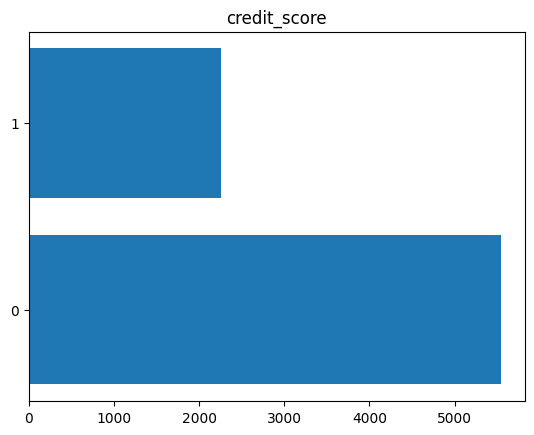

In [ ]:
n1 = df2['credit_score'].sum()
n0 = len(df2) - n1

fig, ax = plt.subplots()

ax.barh([1, 2], [n0, n1])
ax.set_yticks([1, 2])
ax.set_yticklabels(['0', '1'])
ax.set_title('credit_score')

plt.show()

**Análisis de la Distribución de la Variable 'credit_score' mediante un Gráfico de Barras**

El código proporcionado crea un gráfico de barras horizontal para visualizar la distribución de la variable 'credit_score' en el DataFrame `df2`. La variable 'credit_score' es una variable objetivo o variable de etiqueta, que contiene dos categorías únicas: 0 y 1. El gráfico de barras muestra la cantidad de clientes clasificados en cada categoría.

**Observaciones:**
- Se observa un desequilibrio entre las categorías, es decir, una diferencia en la cantidad de clientes en cada categoría, esto puede afectar el rendimiento del modelo de riesgo crediticio.
- En función de esta distribución, es importante considerar el enfoque y las técnicas que se utilizarán para abordar el desequilibrio de clases durante la fase de entrenamiento del modelo.

In [ ]:
print(len(df2[df2['monthly_balance'] < -1e25]))
df2 = df2[df2['monthly_balance'] > -1e25].copy()

1


El código imprime la cantidad de filas donde el valor de 'monthly_balance' es menor a -1e25.


**Resumen y Conclusiones:**
- Es posible que los valores extremadamente bajos en la columna 'monthly_balance' (-1e25) sean valores atípicos o errores de registro. Por lo tanto, se han eliminado del DataFrame `df2` mediante el filtrado.
- El DataFrame `df2` ahora contiene solo las filas con valores válidos en la columna 'monthly_balance' después del filtrado.

In [ ]:
print(len(df2[df2['amount_invested_monthly'] >= 10000]))

354


El código proporcionado realiza una revisión en el DataFrame `df2` y cuenta la cantidad de filas donde el valor de 'amount_invested_monthly' es mayor o igual a 10000.


La columna 'amount_invested_monthly' representa la cantidad de dinero invertido mensualmente por los clientes. Al tener un valor igual o mayor a 10000, indica que esos clientes están invirtiendo una cantidad significativa de dinero en sus inversiones mensuales.

**Observaciones:**
- El resultado puede indicar que hay una cantidad considerable de clientes que están realizando inversiones importantes cada mes.
- Estos clientes pueden ser considerados como un grupo interesante o relevante para ciertos análisis o estrategias financieras.

In [ ]:
columns = ['monthly_balance', 'amount_invested_monthly', 'outstanding_debt']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

Se crea un gráfico de distribución (distplot) que muestra la distribución de tres variables seleccionadas: 'monthly_balance', 'amount_invested_monthly' y 'outstanding_debt' en el DataFrame `df2`.

- 'monthly_balance': Representa la distribución de los valores de saldo mensual en cuentas bancarias.
- 'amount_invested_monthly': Representa la distribución de los valores de la cantidad de dinero invertida mensualmente por los clientes.
- 'outstanding_debt': Representa la distribución de los valores de deuda pendiente de los clientes.

**Interpretación del parámetro bin_size:**
El parámetro `bin_size` utilizado en el gráfico de distribución determina el tamaño de los intervalos (bins) utilizados para agrupar los valores. En este caso, se ha especificado un `bin_size` de 0.25, lo que significa que los valores se agruparán en intervalos de 0.25 unidades.

**Observaciones:**
- Se puedes observar una mejor distribución de los valores de cada variable a lo largo del rango de valores.
- Los valores se agrupan cerca de un rango específico, lo cual puede indicar una tendencia o patrón en la distribución.

In [ ]:
columns = ['monthly_balance', 'amount_invested_monthly']

fig = ff.create_distplot([df2[df2['amount_invested_monthly'] < 10000][c] for c in columns], columns, bin_size=.25)
fig.show()

Se muestra la distribución de dos variables seleccionadas: 'monthly_balance' y 'amount_invested_monthly', pero esta vez se ha aplicado un filtro para considerar solo aquellos clientes cuyo valor en 'amount_invested_monthly' es menor a 10000.

**Observaciones:**
- Al aplicar el filtro para considerar solo los clientes con valores de 'amount_invested_monthly' menores a 10000, el gráfico muestra la distribución de las variables para este grupo específico de clientes.
- Se ibserva cómo se distribuyen los valores de 'monthly_balance' y 'amount_invested_monthly' para este grupo de clientes con inversiones más bajas.

In [ ]:
columns = ['total_emi_per_month']

fig = ff.create_distplot([df2[c] for c in columns], columns, bin_size=.25)
fig.show()

Se crea un gráfico de distribución (distplot) que muestra la distribución de la variable 'total_emi_per_month' en el DataFrame `df2`.

- 'total_emi_per_month': Representa la distribución de los valores del total de cuotas mensuales de pago que los clientes deben cumplir por sus préstamos u obligaciones financieras.


**Observaciones:**
- El gráfico muestra la forma de la distribución de los valores de 'total_emi_per_month'.
- Se observa una gran densidad al inicio del gráfico y por tanto no se observa un patrón especiifico en la distribución pero si se observa una tendencia a otorgar una cantidad pequeña de las cuotas en general.

In [ ]:
len(df2[df2['total_emi_per_month'] > 1000])

305

El código Se cuenta la cantidad de filas donde el valor de 'total_emi_per_month' es mayor a 1000.

Se muestra que hay 305 filas en el DataFrame `df2` donde el valor de 'total_emi_per_month' es mayor a 1000.


La columna 'total_emi_per_month' representa el total de cuotas mensuales de pago que los clientes deben cumplir por sus préstamos u obligaciones financieras. Al tener un valor mayor a 1000, indica que esos clientes están pagando cuotas mensuales de un monto significativo.

**Observaciones:**
- El resultado puede indicar que hay una cantidad considerable de clientes que están pagando cuotas mensuales importantes por sus préstamos u obligaciones financieras.
- Puede ser relevante investigar las características y el comportamiento financiero de este grupo de clientes, ya que sus pagos mensuales son más altos en comparación con otros clientes.

In [ ]:
len(df2[df2['total_emi_per_month'] > 50000])

107

Se cuenta la cantidad de filas donde el valor de 'total_emi_per_month' es mayor a 50000.

Se muestra que hay 107 filas en el DataFrame `df2` donde el valor de 'total_emi_per_month' es mayor a 50000.

**Observaciones:**
- El resultado puede indicar que hay un grupo pequeño pero significativo de clientes que están pagando cuotas mensuales muy elevadas por sus préstamos u obligaciones financieras.
- Este grupo de clientes puede ser considerado de alto riesgo debido a los pagos mensuales tan elevados que están realizando.

In [ ]:
columns = ['total_emi_per_month']

fig = ff.create_distplot([df2[df2['total_emi_per_month'] < 1000][c] for c in columns], columns, bin_size=.25)
fig.show()

Se muestra la distribución de la variable 'total_emi_per_month' en el DataFrame `df2`, pero esta vez se ha aplicado un filtro para considerar solo aquellos clientes cuyo valor en 'total_emi_per_month' es menor a 1000.


**Observaciones:**
- Al aplicar el filtro para considerar solo los clientes con valores de 'total_emi_per_month' menores a 1000, el gráfico muestra la distribución de las cuotas mensuales de pago para este grupo específico de clientes con pagos mensuales más bajos.
- Se observa una gran cantidad de observaciones cercanos al cero, ¿será que están en el cero? Veamoslo a continuación

In [ ]:
len(df2[df2['total_emi_per_month'] == 0])

804

Significado de 'total_emi_per_month':
La columna 'total_emi_per_month' representa el total de cuotas mensuales de pago que los clientes deben cumplir por sus préstamos u obligaciones financieras. Al tener un valor igual a 0, indica que esos clientes no tienen cuotas mensuales de pago en sus préstamos u obligaciones financieras.

**Observaciones**:

El resultado puede indicar que hay un grupo considerable de clientes que no tienen cuotas mensuales de pago, lo que puede deberse a diferentes razones, como tener préstamos con pagos únicos o no tener préstamos activos.

In [ ]:
columns = ['total_emi_per_month']

df4 = df2[df2['total_emi_per_month'] > 0]
df4 = df4[df4['total_emi_per_month'] < 1000]

fig = ff.create_distplot([df4[c] for c in columns], columns, bin_size=.25)
fig.show()

Se muestra la distribución de la variable 'total_emi_per_month' en el DataFrame `df2`, pero esta vez se ha aplicado un filtro para considerar solo aquellos clientes cuyo valor en 'total_emi_per_month' está entre 0 y 1000.

In [ ]:
len(df.payment_of_min_amount.unique())

3

In [ ]:
df.payment_of_min_amount.unique()

array(['No', 'Yes', 'NM'], dtype=object)

Se cuenta la cantidad de valores únicos presentes en esta columna, existiendo 3 valores únicos en la columna 'payment_of_min_amount' del DataFrame `df`: 'No', 'Yes' y 'NM'

**Significado de 'payment_of_min_amount':**
La columna 'payment_of_min_amount' parece representar información sobre el cumplimiento del pago del monto mínimo requerido por los clientes en sus obligaciones financieras.

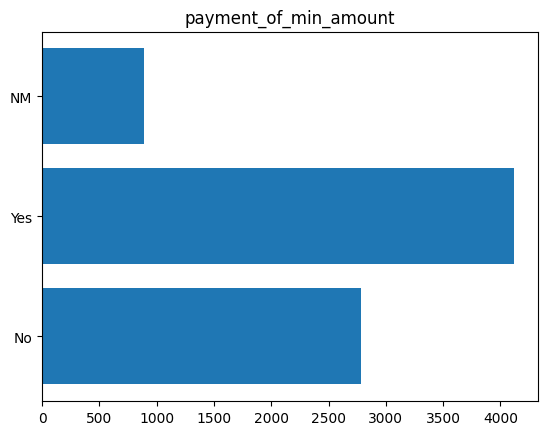

In [ ]:
n0 = len(df2[df2['payment_of_min_amount'] == 'No'])
n1 = len(df2[df2['payment_of_min_amount'] == 'Yes'])
n2 = len(df2[df2['payment_of_min_amount'] == 'NM'])

fig, ax = plt.subplots()

ax.barh([1, 2, 3], [n0, n1, n2])
ax.set_yticks([1, 2, 3])
ax.set_yticklabels(['No', 'Yes', 'NM'])
ax.set_title('payment_of_min_amount')

plt.show()

Se observa la cantdad de observaciones en cada categoría, habiendo un pequeño desbalance entre 'Yes' y 'No', pero nada preocupante, sin embargo existe un desbalance considerable con la variable 'NM', existiendo menos observaciones, lo cual podría afectar el rendimiento de modelo.

In [ ]:
len(df.payment_behaviour.unique())

7

In [ ]:
df.payment_behaviour.unique()

array(['High_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Small_value_payments', '!@9#%8',
       'Low_spent_Medium_value_payments',
       'High_spent_Large_value_payments',
       'Low_spent_Large_value_payments'], dtype=object)

Se realiza un análisis en la columna 'payment_behaviour' del DataFrame `df` y cuenta la cantidad de valores únicos presentes en esta columna. También se muestra los valores únicos encontrados en la columna.


La columna 'payment_behaviour' parece representar el comportamiento de pago de los clientes en función de sus gastos y el valor de sus pagos.

**Descripción de los Valores Únicos en 'payment_behaviour':**
- 'High_spent_Medium_value_payments': Indica un comportamiento de pago donde los clientes tienen altos gastos y realizan pagos de valor medio.
- 'Low_spent_Small_value_payments': Indica un comportamiento de pago donde los clientes tienen bajos gastos y realizan pagos de valor pequeño.
- 'High_spent_Small_value_payments': Indica un comportamiento de pago donde los clientes tienen altos gastos y realizan pagos de valor pequeño.
- '!@9#%8': Es un valor inusual o atípico que podría requerir atención o limpieza en los datos.
- 'Low_spent_Medium_value_payments': Indica un comportamiento de pago donde los clientes tienen bajos gastos y realizan pagos de valor medio.
- 'High_spent_Large_value_payments': Indica un comportamiento de pago donde los clientes tienen altos gastos y realizan pagos de valor grande.
- 'Low_spent_Large_value_payments': Indica un comportamiento de pago donde los clientes tienen bajos gastos y realizan pagos de valor grande.

**Observaciones:**
- La columna 'payment_behaviour' presenta una variedad de comportamientos de pago de los clientes, reflejados en los diferentes valores únicos encontrados.

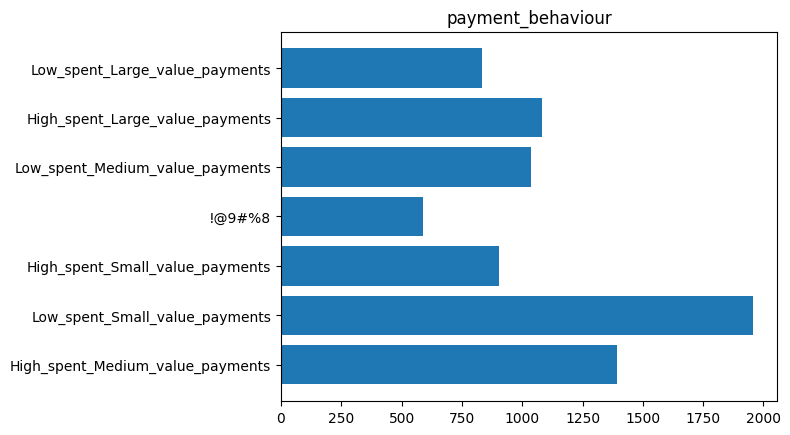

In [ ]:
nn = []
pb = df.payment_behaviour.unique()
for x in pb:
    nn.append(len(df2[df2['payment_behaviour'] == x]))

fig, ax = plt.subplots()

ax.barh(range(7), nn)
ax.set_yticks(range(7))
ax.set_yticklabels(pb)
ax.set_title('payment_behaviour')

plt.show()

No se observa un desbalance considerable entre las categorías, sin embargo, de todas formas hay varios valores en la categoría '!@9#%8', los cuales deben ser tratados antes de entrenar el modelo.

In [ ]:
numcols = list(set(df.columns) - set(['customer_id', 'occupation',
                                        'payment_of_min_amount', 'payment_behaviour']))

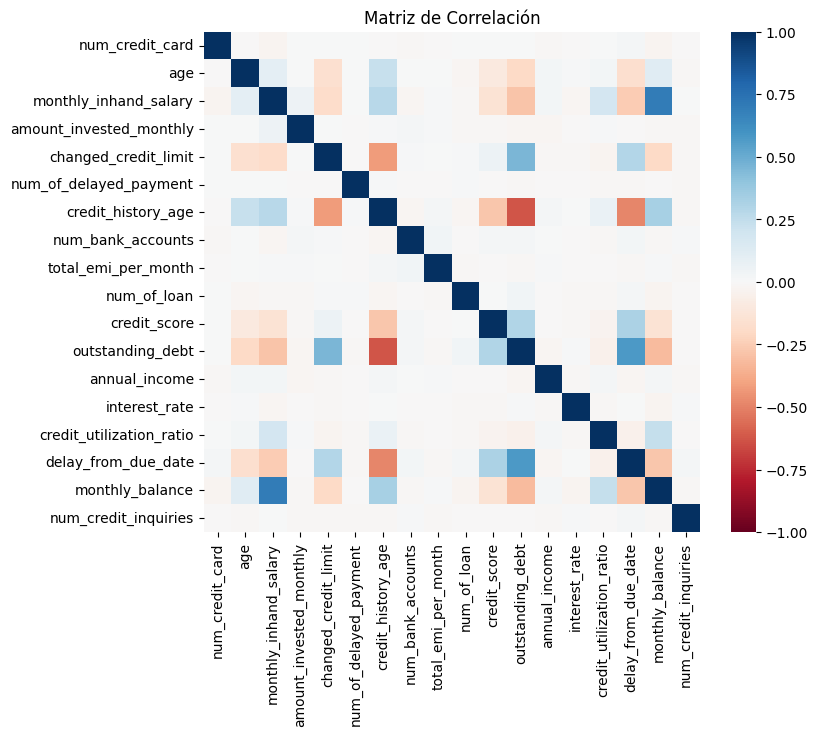

In [ ]:
fig, ax = plt.subplots(figsize=(8,6.5))

corr = df2[numcols].corr()

ax = sns.heatmap(corr,
                 xticklabels=corr.columns,
                 yticklabels=corr.columns,
                 vmax=1.0,
                 vmin=-1.0,
                 cmap='RdBu')

ax.set_title('Matriz de Correlación')

plt.show()

**Matriz de Correlación - Análisis de Relaciones entre Variables Numéricas**

El código proporcionado crea una matriz de correlación y visualiza sus resultados utilizando un mapa de calor (heatmap).

**Observaciones:**
- No se observan fuertes correlaciones entre las variables, o almenos nada demasiado preocupante antes de probar un modelo.


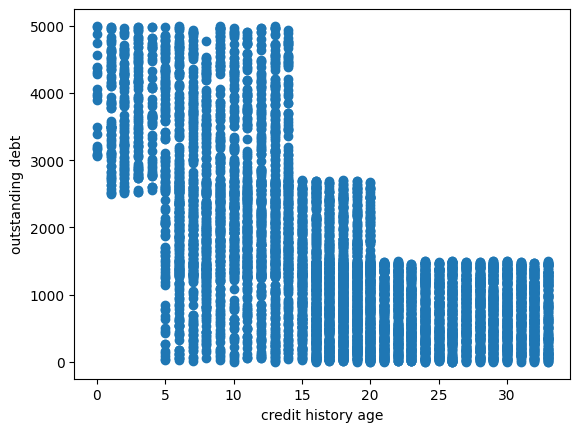

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df2.credit_history_age, df2.outstanding_debt)
ax.set_xlabel('credit history age')
ax.set_ylabel('outstanding debt')

plt.show()

**Gráfico de Dispersión (Scatter Plot) entre 'credit_history_age' y 'outstanding_debt'**

Se crea un gráfico de dispersión (scatter plot) entre las variables 'credit_history_age' (edad de historial crediticio) y 'outstanding_debt' (deuda pendiente) presentes en el DataFrame `df2`.

Se muestra la relación entre las variables 'credit_history_age' y 'outstanding_debt' para cada punto de datos en el DataFrame `df2`. Cada punto en el gráfico representa un cliente del banco.

- **Eje X (Horizontal)**: Representa la variable 'credit_history_age' que indica la edad del historial crediticio de cada cliente.
- **Eje Y (Vertical)**: Representa la variable 'outstanding_debt' que indica la cantidad de deuda pendiente de cada cliente.

**Observaciones:**
- Los puntos tienden a agruparse verticalmente, indicando que hay varios clientes con valores similares en ambas variables en ese grupo. Es decir, hay una tendencia a tener valores similares para 'credit_history_age' y 'outstanding_debt' en esos grupos.
- Esto sugiere que ciertos grupos de clientes pueden tener características similares en términos de edad de historial crediticio y deuda pendiente. Esto podría deberse a políticas de préstamo o condiciones específicas que afectan a ciertos segmentos de clientes de manera similar.
- Es importante analizar más a fondo estos grupos verticales para comprender las razones detrás de las agrupaciones. Esto puede implicar explorar características adicionales de los clientes o buscar relaciones específicas en el contexto del negocio.


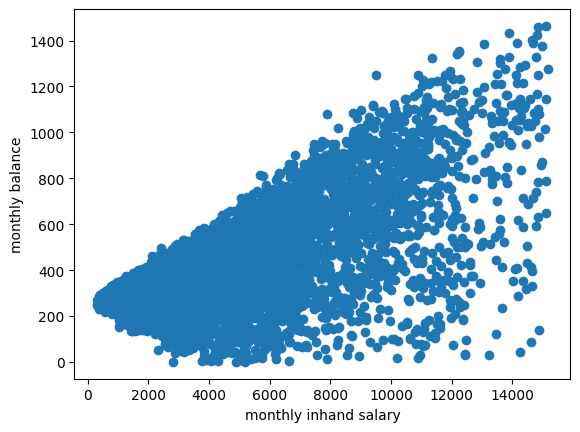

In [ ]:
fig, ax = plt.subplots()

ax.scatter(df2.monthly_inhand_salary, df2.monthly_balance)
ax.set_xlabel('monthly inhand salary')
ax.set_ylabel('monthly balance')

plt.show()

Se crea un gráfico de dispersión (scatter plot) entre las variables 'monthly_inhand_salary' (salario mensual neto) y 'monthly_balance' (balance mensual) presentes en el DataFrame `df2`.


- **Eje X (Horizontal)**: Representa la variable 'monthly_inhand_salary' que indica el salario mensual neto de cada cliente después de deducciones.
- **Eje Y (Vertical)**: Representa la variable 'monthly_balance' que indica el balance mensual de cada cliente, es decir, la diferencia entre los ingresos y los gastos del mes.

**Observaciones:**
- Al analizar el gráfico de dispersión, se pueden identificar algunas tendencias:
  - En general, parece haber una relación positiva entre el salario mensual neto y el balance mensual. A medida que el salario aumenta, el balance mensual tiende a aumentar también.
  - Sin embargo, también hay dispersión en los datos, lo que indica que la relación no es perfectamente lineal y otros factores pueden influir en el balance mensual además del salario.

In [ ]:
len(numcols)

18

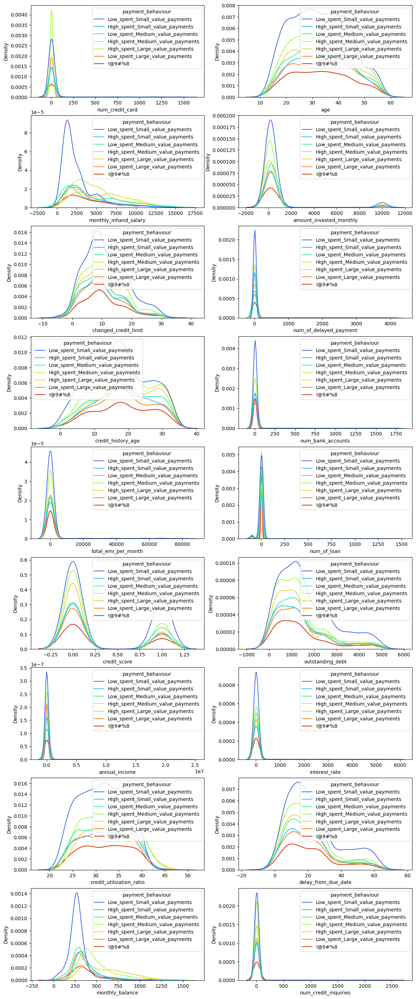

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='payment_behaviour', palette='turbo', ax = ax[i][j])
        c += 1

plt.show()

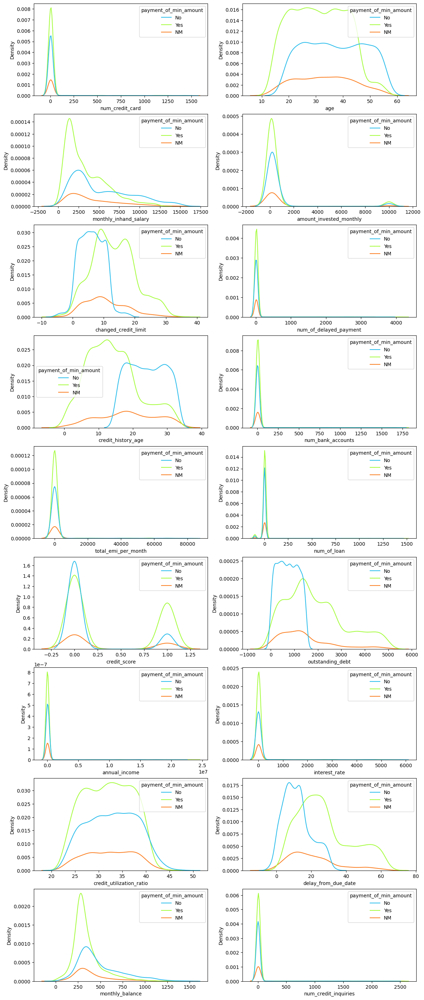

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='payment_of_min_amount', palette='turbo', ax = ax[i][j])
        c += 1

plt.show()

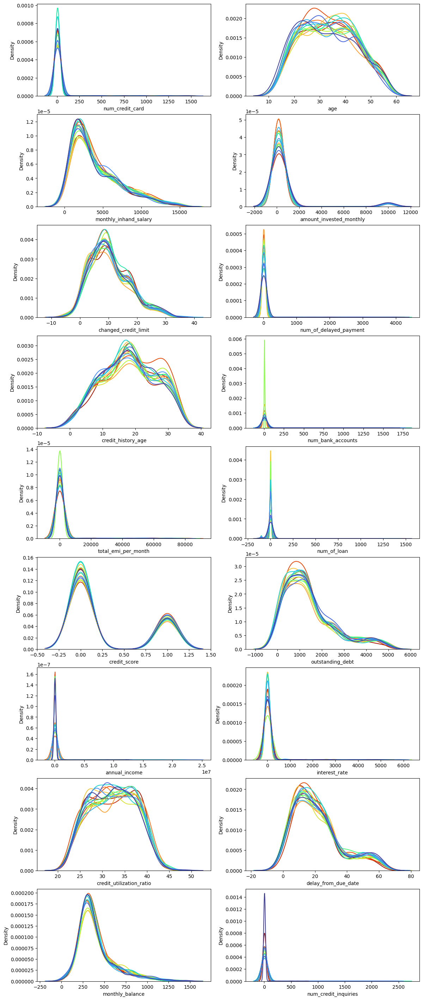

In [ ]:
fig, ax = plt.subplots(9, 2, figsize=(14, 36))

c = 0
for i in range(9):
    for j in range(2):
        sns.kdeplot(data=df2, x=numcols[c], hue='occupation', palette='turbo', ax = ax[i][j], legend=False)
        c += 1

plt.show()

Se generan múltiples gráficos de densidad (KDE plots) para cada una de las 18 columnas numéricas (numcols) en el DataFrame `df2`. Estos gráficos se dividen en tres grupos, cada uno con 9 filas y 2 columnas, y utilizan diferentes colores para visualizar la distribución de los datos según distintas variables categóricas.

**Grupo 1: KDE plots con 'payment_behaviour' como variable categórica**
- Se generan gráficos de densidad (KDE plots) para cada columna numérica en `df2`, dividiendo los datos según la variable categórica 'payment_behaviour'.
- Cada gráfico muestra la distribución de datos para una columna numérica específica, diferenciando los pagos según su comportamiento de pago ('payment_behaviour').

**Grupo 2: KDE plots con 'payment_of_min_amount' como variable categórica**
- Similar al grupo anterior, se generan gráficos de densidad (KDE plots) para cada columna numérica en `df2`, pero en este caso, los datos se dividen según la variable categórica 'payment_of_min_amount'.
- Cada gráfico muestra la distribución de datos para una columna numérica específica, según si los clientes han realizado el pago del monto mínimo ('payment_of_min_amount').

**Grupo 3: KDE plots con 'occupation' como variable categórica**
- Nuevamente, se generan gráficos de densidad (KDE plots) para cada columna numérica en `df2`, esta vez, dividiendo los datos según la variable categórica 'occupation'.
- Cada gráfico muestra la distribución de datos para una columna numérica específica, agrupando a los clientes según su ocupación.

**Interpretación de los Gráficos:**
Con esto se pueden observar cómo se distribuyen los valores para diferentes categorías de las variables categóricas 'payment_behaviour', 'payment_of_min_amount' y 'occupation'.

Cada gráfico muestra la forma y densidad de la distribución de los datos para una columna numérica específica, lo que ayuda a identificar patrones y tendencias en los datos, y a detectar posibles diferencias en la distribución entre diferentes grupos.

In [ ]:
df.duplicated().sum()

0

No hay filas duplicadas

## Preparación de Datos

### Nulos y Outliers

Del análisis exploratorio se conoce que varias columnas de dataframe presentan valores faltantes. Se decide eliminar las filas con datos nulos, reduciendo el número de filas a 7798.

In [ ]:
dfc = df.dropna()

También se observó la presencia de outliers, valores atípicos y otros directamente erroneos, como números negativos o edades por sobre 1000. Se remueven los valores negativos y outliers.

In [ ]:
dfc = dfc[dfc.age <= 100].copy()
dfc = dfc[dfc.age > 0].copy()

dfc = dfc[dfc['num_bank_accounts'] <= 20]
dfc = dfc[dfc['num_credit_card'] <= 20]
dfc = dfc[dfc['interest_rate'] <= 50]
dfc = dfc[dfc['num_of_loan'] <= 20]

dfc = dfc[dfc['num_bank_accounts'] >= 0]
dfc = dfc[dfc['num_credit_card'] >= 0]
dfc = dfc[dfc['interest_rate'] >= 0]
dfc = dfc[dfc['num_of_loan'] >= 0]

dfc = dfc[dfc['num_of_delayed_payment'] <= 100]
dfc = dfc[dfc['num_of_delayed_payment'] >= 0]
dfc = dfc[dfc['changed_credit_limit'] >= 0]
dfc = dfc[dfc['num_credit_inquiries'] <= 100]

dfc = dfc[dfc['monthly_balance'] > -1e25]
dfc = dfc[dfc.amount_invested_monthly < 2000]

dfc = dfc.reset_index().copy()
del dfc['index']

### Preprocesamiento

El dataset posee 3 atributos categóricos: "payment_behaviour", "payment_of_min_amount" y "occupation". El primero señala el comportamiento de pago de los usuarios, este se puede considerar un atributo ordinal, tomando 'Low_spent' < 'High_spent' y 'Small_value' < 'Medium_value' < 'Large_value', de modo que se reemplazan por enteros de 1 a 6 respetando el orden.  Además existe la categoría '!@9#%8', que claramente corresponde a un error en los datos, está puede ser una categoría real cuyo nombre se vió alterado o una categoría adicional para casos en los que ha habido un error en la variable, como datos faltantes. Dada la naturaleza desconocida de '!@9#%8', sería razonable eliminarla, sin embargo para una primera iteración se decide mantener la categoría, reemplazandola por -1.

El atributo "payment_of_min_amount" tiene 3 categorías, 'Yes', 'No' y 'MN', las cuales se reemplazan por 1, -1 y 0 respectivamente. El atributo "occupation" contiene más de 10 categorías nominales; por simplicidad se decide remover la columna.

Todas la variables se escalan con MinMaxScaler a valores entre 0 y 1.

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler, FunctionTransformer, RobustScaler

In [ ]:
d1 = dict(zip(['High_spent_Medium_value_payments', 'Low_spent_Small_value_payments', 'High_spent_Small_value_payments', '!@9#%8',
               'Low_spent_Medium_value_payments', 'High_spent_Large_value_payments', 'Low_spent_Large_value_payments'],
              [5, 1, 4, -1, 2, 6, 3]))

d2 = {'Yes': 1, 'No': -1, 'NM': 0}

dfc['payment_behaviour_n'] = dfc['payment_behaviour'].apply(lambda x: d1[x])
dfc['payment_of_min_amount_n'] = dfc['payment_of_min_amount'].apply(lambda x: d2[x])

In [ ]:
numcols = list(set(numcols)-set(['credit_score']))

ct = ColumnTransformer([
    #('identity', 'passthrough', ['credit_score']),
    ('minmax', MinMaxScaler(), numcols+['payment_behaviour_n', 'payment_of_min_amount_n'])
], verbose_feature_names_out=False)

ct.set_output(transform='pandas')

ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                 ['num_credit_card', 'age',
                                  'monthly_inhand_salary',
                                  'amount_invested_monthly',
                                  'changed_credit_limit',
                                  'num_of_delayed_payment',
                                  'credit_history_age', 'num_bank_accounts',
                                  'total_emi_per_month', 'num_of_loan',
                                  'outstanding_debt', 'annual_income',
                                  'interest_rate', 'credit_utilization_ratio',
                                  'delay_from_due_date', 'monthly_balance',
                                  'num_credit_inquiries', 'payment_behaviour_n',
                                  'payment_of_min_amount_n'])],
                  verbose_feature_names_out=False)

In [ ]:
ct.fit_transform(dfc)

,num_credit_card,age,monthly_inhand_salary,amount_invested_monthly,changed_credit_limit,num_of_delayed_payment,credit_history_age,num_bank_accounts,total_emi_per_month,num_of_loan,outstanding_debt,annual_income,interest_rate,credit_utilization_ratio,delay_from_due_date,monthly_balance,num_credit_inquiries,payment_behaviour_n,payment_of_min_amount_n
0,0.363636,0.333333,0.183963,0.140008,0.154067,0.045455,0.818182,0.181818,0.000232,0.111111,0.120993,0.001168,0.151515,0.428190,0.111111,0.243059,0.025641,0.285714,0.0
1,0.090909,0.476190,0.683926,0.556773,0.266743,0.022727,0.939394,0.000000,0.011226,0.222222,0.070396,0.005216,0.212121,0.287880,0.069444,0.270416,0.051282,0.428571,0.0
2,0.636364,0.380952,0.155244,0.018757,0.490658,0.159091,0.454545,0.727273,0.000868,0.333333,0.340923,0.001136,0.424242,0.461512,0.486111,0.280799,0.115385,0.857143,1.0
3,0.454545,0.238095,0.641854,0.162820,0.235125,0.125000,0.636364,0.181818,0.002795,0.333333,0.275605,0.004525,0.181818,0.236393,0.222222,0.507404,0.102564,1.000000,0.0
4,0.363636,0.523810,0.300267,0.316670,0.157517,0.090909,0.818182,0.545455,0.001532,0.333333,0.035792,0.001988,0.393939,0.426128,0.208333,0.100297,0.089744,0.285714,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6396,0.727273,0.690476,0.090873,0.015339,0.504168,0.193182,0.272727,0.909091,0.001154,0.777778,0.635575,0.000539,1.000000,0.518480,0.347222,0.196375,0.153846,1.000000,1.0
6397,0.909091,0.619048,0.170507,0.123052,0.077896,0.250000,0.515152,0.636364,0.001748,1.000000,0.307978,0.001068,0.545455,0.334605,0.902778,0.142885,0.141026,0.714286,1.0
6398,0.363636,0.428571,0.949868,0.062590,0.173326,0.022727,0.969697,0.454545,0.003574,0.333333,0.077765,0.007074,0.000000,0.816700,0.208333,0.884136,0.012821,1.000000,0.0
6399,0.090909,0.619048,0.668692,0.126399,0.192297,0.011364,0.878788,0.454545,0.002840,0.444444,0.089275,0.004742,0.181818,0.574486,0.263889,0.571091,0.000000,1.000000,0.0


### Holdout

Se separan los datos en conjuntos de entrenamiento y prueba, con un 70% y 30% respectivamente.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(dfc, dfc.credit_score, test_size=0.3, random_state=0, stratify=dfc.credit_score)

## Baseline

Se implementan los siguientes clasificadores con sus parámetros por defecto:

- Dummy
- Decision Tree
- Random Forest
- SVM
- Logistic Regression
- KNN
- GBM
- XGB

Luego se ajustan a los datos de entrenamiento y se evalúan con los datos de prueba, midiendo las métricas f1-score, accuracy y recall, donde se toma credit_score=1 como la clase positiva. Tras evaluar los clasificadores se puede ver que, para las métricas consideradas, todos obtienen mejores resultados en comparación a realizar una clasificación aleatoria. El modelo con mejor desempeño es LightGBMClassifier, con valores de 0.569,	0.777 y 0.501 en f1, accuracy y recall respectivamente, seguido de cerca por random forest en las 3 métricas.


In [ ]:
!pip install xgboost
!pip install lightgbm

In [ ]:
from sklearn.dummy import DummyClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier, plot_importance
from lightgbm import LGBMClassifier

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, f1_score, recall_score

from sklearn.pipeline import Pipeline

In [ ]:
def pipes(clf, ct):
    pipe = Pipeline([('Transform', ct),
                 ('Classifier', clf)])
    return pipe

clfs = [DummyClassifier(strategy='stratified'), SVC(), DecisionTreeClassifier(), RandomForestClassifier(),
        LogisticRegression(), KNeighborsClassifier(), XGBClassifier(), LGBMClassifier()]

names = ['DummyClassifier', 'SVC', 'DecisionTreeClassifier', 'RandomForestClassifier',
        'LogisticRegression', 'KNeighborsClassifier', 'XGBClassifier', 'LightGBMClassifier']

f1s = list()
acc = list()
rec = list()

for name, clf in zip(names, clfs):
    pipe = pipes(clf, ct)
    pipe.fit(X_train, y_train)
    yp = pipe.predict(X_test)
    print('-----'+name+'-----')
    print(classification_report(y_test, yp))
    f1s.append(f1_score(y_test, yp))
    acc.append(accuracy_score(y_test, yp))
    rec.append(recall_score(y_test, yp))

mdf = pd.DataFrame({'Classifier':names, 'F1':f1s, 'Accuracy':acc, 'Recall':rec})

-----DummyClassifier-----
              precision    recall  f1-score   support

           0       0.71      0.73      0.72      1358
           1       0.29      0.27      0.28       563

    accuracy                           0.59      1921
   macro avg       0.50      0.50      0.50      1921
weighted avg       0.58      0.59      0.59      1921

-----SVC-----
              precision    recall  f1-score   support

           0       0.80      0.90      0.85      1358
           1       0.65      0.46      0.54       563

    accuracy                           0.77      1921
   macro avg       0.73      0.68      0.69      1921
weighted avg       0.76      0.77      0.76      1921

-----DecisionTreeClassifier-----
              precision    recall  f1-score   support

           0       0.78      0.77      0.78      1358
           1       0.47      0.49      0.48       563

    accuracy                           0.69      1921
   macro avg       0.63      0.63      0.63      1921
w

In [ ]:
mdf

,Classifier,F1,Accuracy,Recall
0,DummyClassifier,0.278341,0.592400,0.268206
1,SVC,0.540146,0.770432,0.460036
2,DecisionTreeClassifier,0.479654,0.687142,0.492007
3,RandomForestClassifier,0.566834,0.775638,0.500888
4,LogisticRegression,0.483493,0.747527,0.403197
5,KNeighborsClassifier,0.513595,0.748568,0.452931
6,XGBClassifier,0.520357,0.748568,0.465364
7,LightGBMClassifier,0.569122,0.777720,0.500888


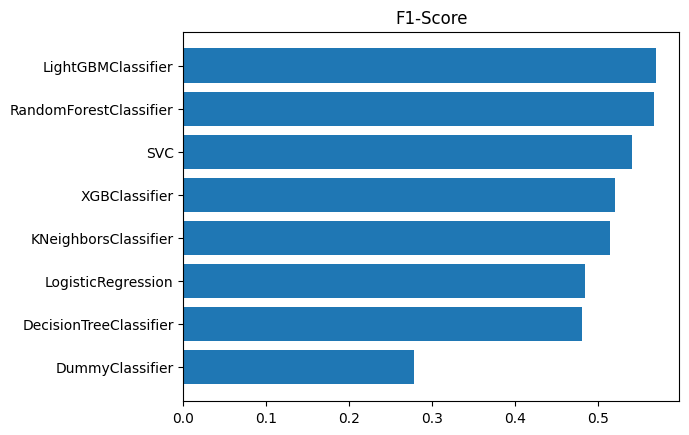

In [ ]:
mdf.sort_values(by='F1', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.F1)
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('F1-Score')

plt.show()

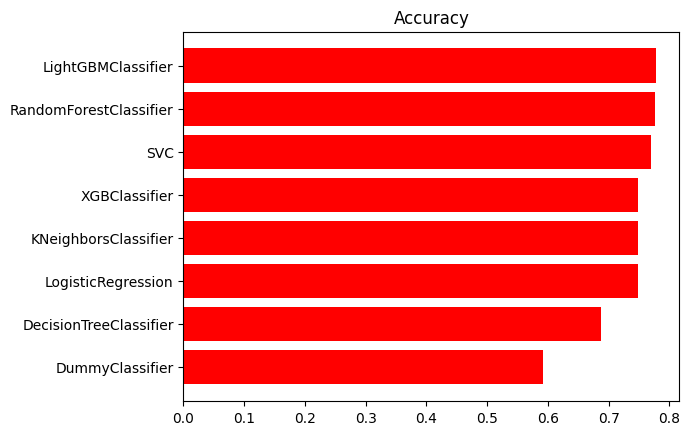

In [ ]:
mdf.sort_values(by='Accuracy', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.Accuracy, color='red')
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('Accuracy')

plt.show()

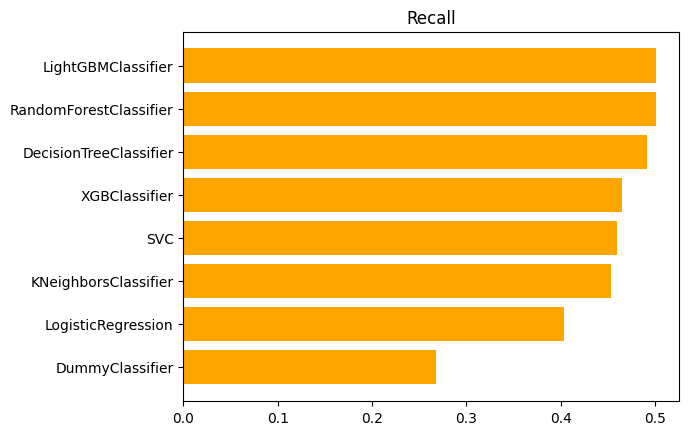

In [ ]:
mdf.sort_values(by='Recall', inplace=True)

fig, ax = plt.subplots()

ax.barh(range(len(f1s)), mdf.Recall, color='orange')
ax.set_yticks(range(len(f1s)))
ax.set_yticklabels(mdf.Classifier)
ax.set_title('Recall')

plt.show()

## Optimización

Dados los resultados de la sección anterior, se seleccionan GBM y random forest como el mejor y segundo clasificador respectivamente, y se continua con estos a la etapa de optimización de hiper-parámetros. Para realizar la optimización se utiliza el método grid search sobre los siguientes hiper-parámetros:

Randomd Forest:
- **Criterion:** 'gini', 'entropy', 'log loss'
- **min samples split:** 2, 3, 4, 5
- **Número de estimadores:** 10, 50, 100, 150
- **Max features:** 'sqrt', 'log2'

Randomd Forest:
- **Tipo de boosting:** 'gbdt', 'dart', 'rf'
- **Learning rate:** $10^{-1}$, $10^{-2}$, $10^{-3}$
- **Número de estimadores:** 10, 50, 100, 150

Además, para los dos clasificadores, se les asigna peso a las clases para contrarrestar el desbalance de las mismas. La optimización de hiper-parámetros se realiza en base al f1 score.

Con la optimización de hipe-parámetros ambos modelos mejoran sus resultados, pero no en gran medida, random forest alcanza un f1 score de 0.58 y GBM de 0.6.

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.utils.class_weight import compute_class_weight

In [ ]:
y_train.sum() / len(y_train)

0.29330357142857144

In [ ]:
w = dict(zip([0, 1], compute_class_weight('balanced', classes=(0, 1), y=y_train)))

rfp = {'criterion':('gini', 'entropy', 'log_loss'),
       'min_samples_split': [2,3,4,5],
       'n_estimators': [10, 50, 100, 150],
       'max_features': ('sqrt', 'log2'),
       'class_weight': [w]}

pipe_rf_gs = Pipeline([('Transform', ct),
                 ('GridSCV', GridSearchCV(RandomForestClassifier(), rfp, scoring='f1'))])

lgp = {'boosting_type':('gbdt', 'dart', 'rf'),
       'learning_rate': [1e-1, 1e-2, 1e-3],
       'n_estimators': [10, 50, 100, 150],
       'class_weight': [w]}

pipe_lg_gs = Pipeline([('Transform', ct),
                 ('GridSCV', GridSearchCV(LGBMClassifier(), lgp, scoring='f1'))])

In [ ]:
pipe_rf_gs.fit(X_train, y_train)

Pipeline(steps=[('Transform',
                 ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                                  ['num_credit_card', 'age',
                                                   'monthly_inhand_salary',
                                                   'amount_invested_monthly',
                                                   'changed_credit_limit',
                                                   'num_of_delayed_payment',
                                                   'credit_history_age',
                                                   'num_bank_accounts',
                                                   'total_emi_per_month',
                                                   'num_of_loan',
                                                   'outstanding_debt',
                                                   'annual_income',
                                                   'interest_rate',
                                                   'credit_utili...
                                                   'payment_behaviour_n',
                                                   'payment_of_min_amount_n'])],
                                   verbose_feature_names_out=False)),
                ('GridSCV',
                 GridSearchCV(estimator=RandomForestClassifier(),
                              param_grid={'class_weight': [{0: 0.7075173720783323,
                                                            1: 1.704718417047184}],
                                          'criterion': ('gini', 'entropy',
                                                        'log_loss'),
                                          'max_features': ('sqrt', 'log2'),
                                          'min_samples_split': [2, 3, 4, 5],
                                          'n_estimators': [10, 50, 100, 150]},
                              scoring='f1'))])

In [ ]:
pipe_rf_gs['GridSCV'].best_params_

{'class_weight': {0: 0.7075173720783323, 1: 1.704718417047184},
 'criterion': 'entropy',
 'max_features': 'log2',
 'min_samples_split': 5,
 'n_estimators': 100}

In [ ]:
rf_yp = pipe_rf_gs.predict(X_test)
rff1 = f1_score(y_test, rf_yp)
f1s.append(rff1)
print(rff1)

0.5759682224428997


In [ ]:
pipe_lg_gs.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning:


60 fits failed out of a total of 180.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 967, in fit
    super().fit(X, _y, sample_weight=sample_weight, init_score=init_score, eval_set=valid_sets,
  File "/usr/local/lib/python3.10/dist-packages/lightgbm/sklearn.py", line 748, in fit
    self._Booster = train(
  File "/usr/loca

Pipeline(steps=[('Transform',
                 ColumnTransformer(transformers=[('minmax', MinMaxScaler(),
                                                  ['num_credit_card', 'age',
                                                   'monthly_inhand_salary',
                                                   'amount_invested_monthly',
                                                   'changed_credit_limit',
                                                   'num_of_delayed_payment',
                                                   'credit_history_age',
                                                   'num_bank_accounts',
                                                   'total_emi_per_month',
                                                   'num_of_loan',
                                                   'outstanding_debt',
                                                   'annual_income',
                                                   'interest_rate',
                                                   'credit_utili...
                                                   'monthly_balance',
                                                   'num_credit_inquiries',
                                                   'payment_behaviour_n',
                                                   'payment_of_min_amount_n'])],
                                   verbose_feature_names_out=False)),
                ('GridSCV',
                 GridSearchCV(estimator=LGBMClassifier(),
                              param_grid={'boosting_type': ('gbdt', 'dart',
                                                            'rf'),
                                          'class_weight': [{0: 0.7075173720783323,
                                                            1: 1.704718417047184}],
                                          'learning_rate': [0.1, 0.01, 0.001],
                                          'n_estimators': [10, 50, 100, 150]},
                              scoring='f1'))])

In [ ]:
pipe_lg_gs['GridSCV'].best_params_

{'boosting_type': 'dart',
 'class_weight': {0: 0.7075173720783323, 1: 1.704718417047184},
 'learning_rate': 0.1,
 'n_estimators': 10}

In [ ]:
lg_yp = pipe_lg_gs.predict(X_test)
lgf1 = f1_score(y_test, lg_yp)
f1s.append(lgf1)
print(lgf1)

0.6029992107340173


## Interpretabilidad

En esta sección se realiza un análisis de interpretabilidad simple sobre el modelo GBM entrenado en la etapa anterior, por medio de Shap values. Primero de revisa cuales son los atributos más significativos, a nivel global, para el modelo al momento de tomar decisiones. Se encontró que el atributo de mayor relevancia para predecir 'credit_score' es 'outstanding_debt', seguido de 'interest_rate' y 'delay_from_due_day', mientras que los de menor importancia son 'payment_of_min_amount', 'annual_income' y 'age'. En concreto se observa que a mayor sea la deuda y el tiempo de retraso en su pago, mayor es la probabilidad de tener más riesgo, aunque a la vez haber retrasado el pago más veces parece ser un indicador de bajo riesgo para el modelo.

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.5 MB/s eta 0:00:00


In [ ]:
import shap

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [ ]:
clf = LGBMClassifier(boosting_type='gbdt',
                     class_weight={0: 0.7075173720783323, 1: 1.704718417047184},
                     learning_rate=0.1,
                     n_estimators=10)

ct.fit(X_train)
X = ct.transform(dfc)

clf.fit(ct.transform(X_train), y_train)

explainer = shap.TreeExplainer(clf)
shap_values = explainer(X)

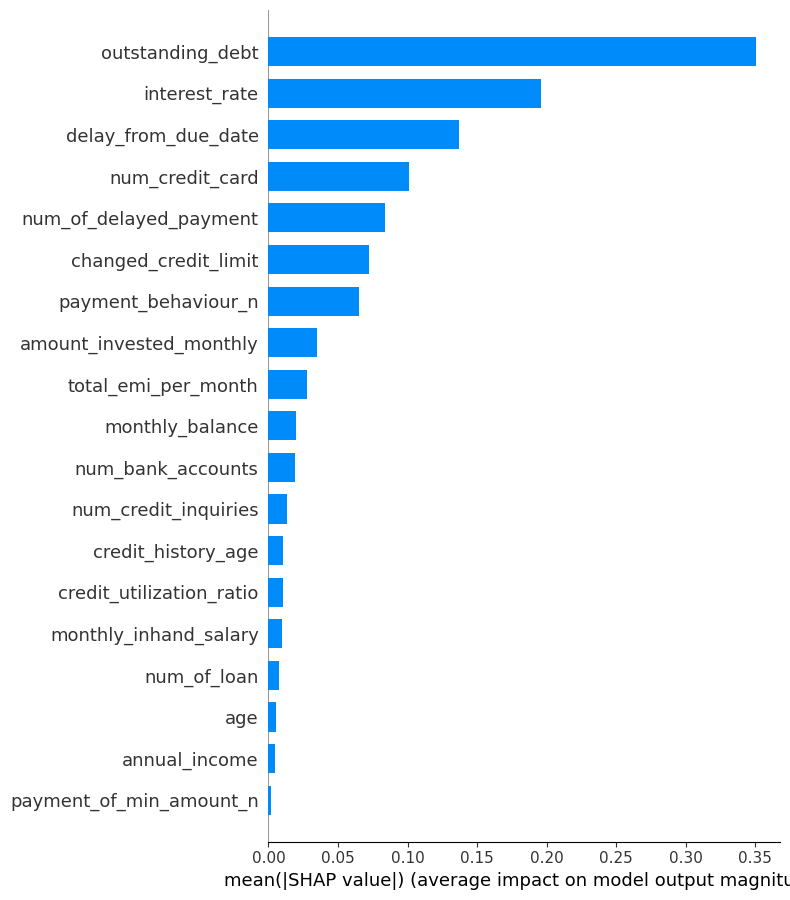

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X, plot_type="bar")

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


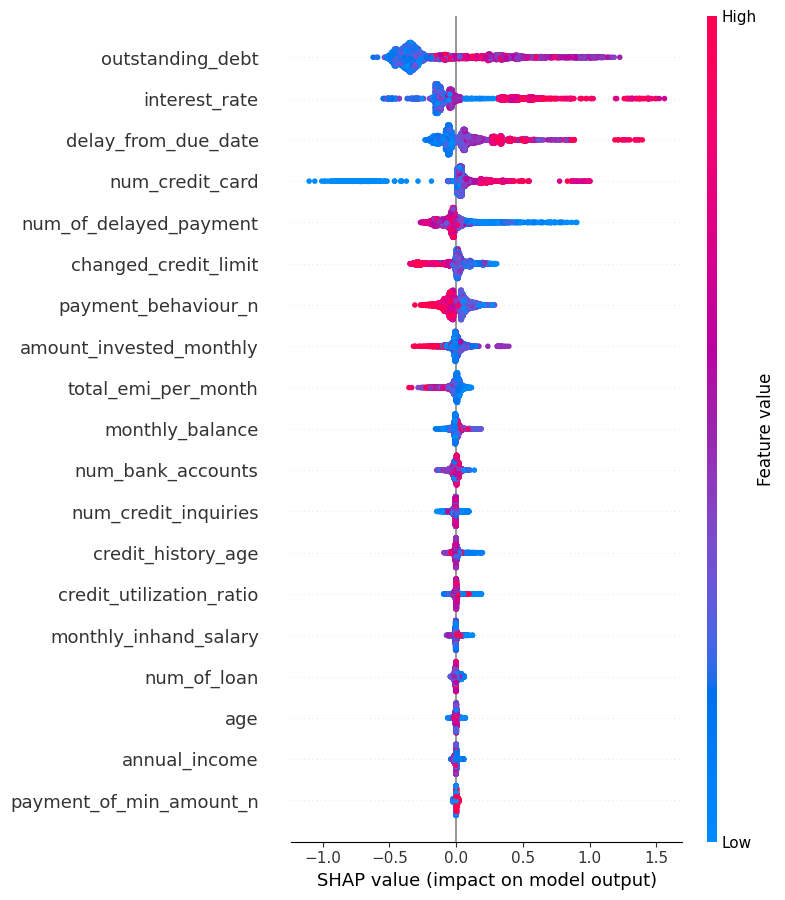

In [ ]:
shap.summary_plot(shap_values[:, :, 1], X)

### 10 observaciones

Luego de haber hecho una revisión global, se procede a exminar el comportamiento del modelo en 10 predicciones particulares, elegidas aleatoriamente. Para cada caso se obtienen las siguientes observaciones:

- **1)** Es de bajo riesgo y se clasifica correctamente. Posee valores altos de 'interest_rate' y 'delay_from_due_date', estas son sus 2 características más influyentes, inclinando la clasificación a alto riesgo. También tiene un valor intermedio de 'changed_credit_limit', que ejerce casi la misma influencia que 'delay_from_due_date' en el sentido contrario, seguido por 'outstanding_debt', 'paymente_behaviuor' y 'num_of_delayed_payment'. El resto de variables apenas tiene efecto.
- **2)** Es de bajo riesgo y se clasifica correctamente. La variable más influyente para su clasificación como bajo riesgo es su bajo valor de 'outstanding_debt'. La variable más influyente para la clasificación de alto riesgo es su valor medio de 'delay_from_due_date', aunque sus valores bajos de 'num_of_delayed_payment' e 'interest_rate', y medio de 'changed_credit_limit' ejercen más del doble de efecto en el sentido opuesto.
- **3)** Es de alto riesgo se clasifica erroneamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' muy cercano al mínimo. También tiene un valor bajo de 'delay_from_due_date' que, si bien ejerce mucha menos influencia que 'outstanding_debt', es una característica que se asocia más al bajo riesgo.
- **4)** Es de alto riesgo y se clasifica correctamente. Se clasifica como de alto riesgo gracias a que posee el valor máximo de 'interst_rate'. La única variable con influencia relevante hacia la clasificación de bajo riesgo es su alto valor de 'changed_credit_limit'.
- **5)** Es de bajo riesgo y se clasifica erroneamente. Se clasifica como de alto riesgo gracias a 'changed_credit_limit', con un valor cercano al mínimo, y a los bajos valores de 'delay_from_due_date' y 'amount_invested_monthly'. Sus valores bajos de 'outstanding_debt' e 'interst_rate' inclinan la clasificación a bajo riesgo.
- **6)** Es de bajo riesgo y se clasifica correctamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' cercano al mínimo. El resto de variables son de poca influencia.
- **7)** Es de bajo riesgo y se clasifica correctamente. Las variables más influyentes son con valores medio altos de 'interest_rate' y 'changed_credit_limit', con influencia a favor de alto riesgo y bajo riesgo respectivamente.
- **8)** Es de alto riesgo y se clasifica correctamente. La clasificación de alto riesgo se debe principalmente a un valor muy alto de 'delay_from_due_date', también contribuye un valor alto de 'outstanding_debt'. Posee un valor alto de 'changed_credit_limit' que influye en favor de la clasificación de bajo riesgo.
- **9)** Es de bajo riesgo y se clasifica erroneamente. Posee altos valores de 'outstanding_debt' y 'num_credit_card', valor medio alto de 'delay_from_due_date', y bajo de 'changed_credit_limit'. Todas estas variables influyen a favor de la clasificación como de alto riesgo. El resto de variables no tienen efecto significativo.
- **10)** Es de bajo riesgo y se clasifica correctamente. Es clasificado como bajo riesgo debido a que posee un valor de 'outstanding_debt' cercano al mínimo.

En general se observa que el análisis global correlaciona con las observaciones particulares, manteniendo coherencia en qué valores de cada atributo tienen determinado efecto en la clasificación. Por otro lado se puede ver que dichas condiciones no son constantes en las clases, por ejemplo no todos los casos de alto riesgo tienen alto 'interest_rate' ni todos los de bajo riesgo un valor bajo. En la mayoría de los casos la predicción está determinada por unas pocas variables y en ocaciones todos los atributos relevantes contribuyen a una clasificación erronea.

Sample: 4801 Label: 0


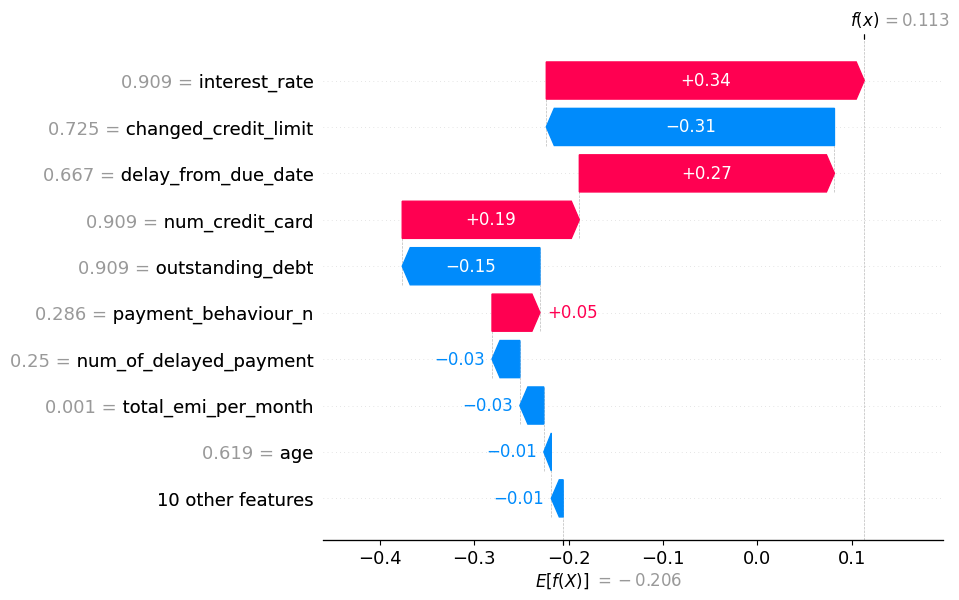

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 2151 Label: 0


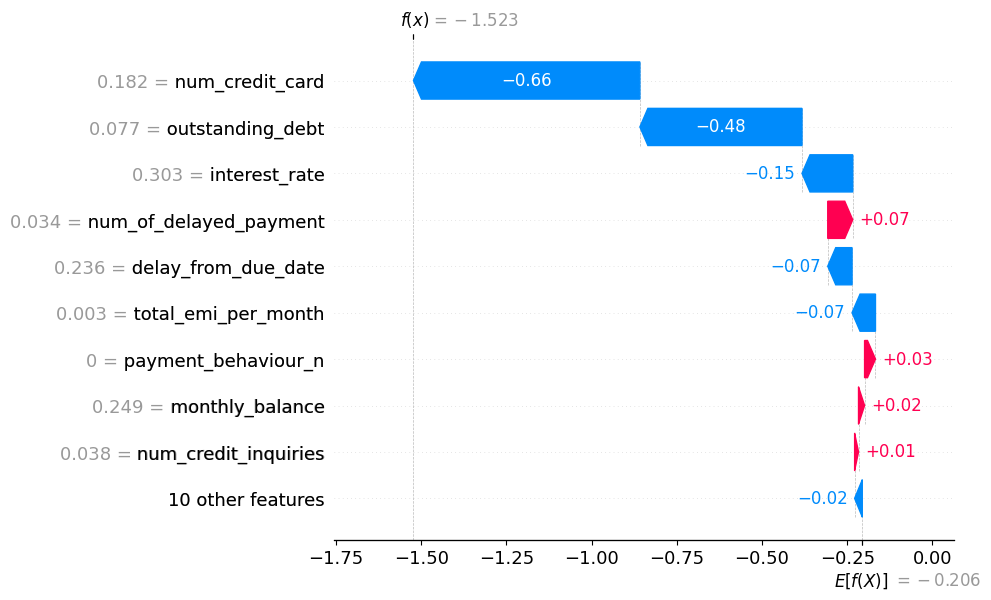

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 2617 Label: 0


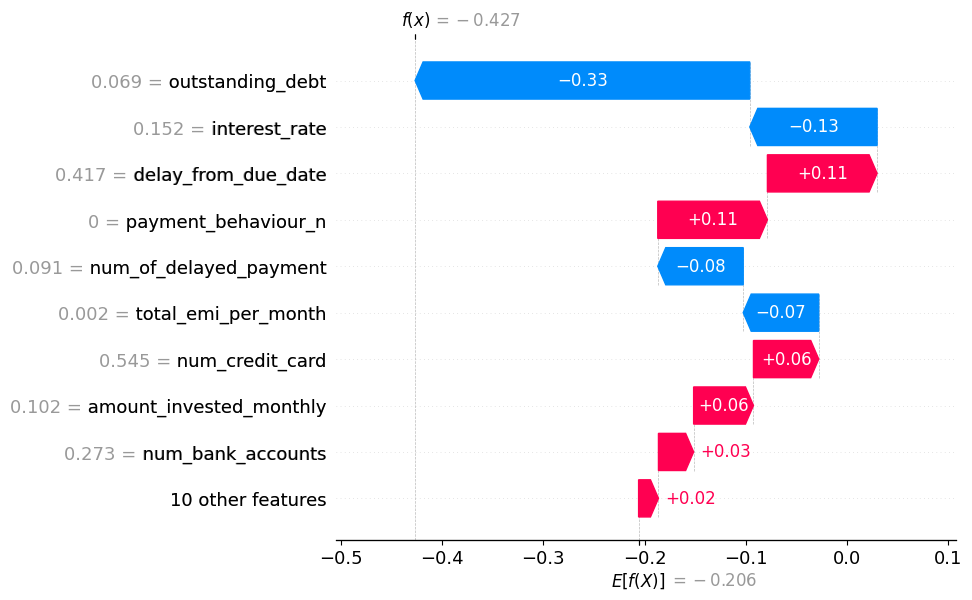

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 5573 Label: 0


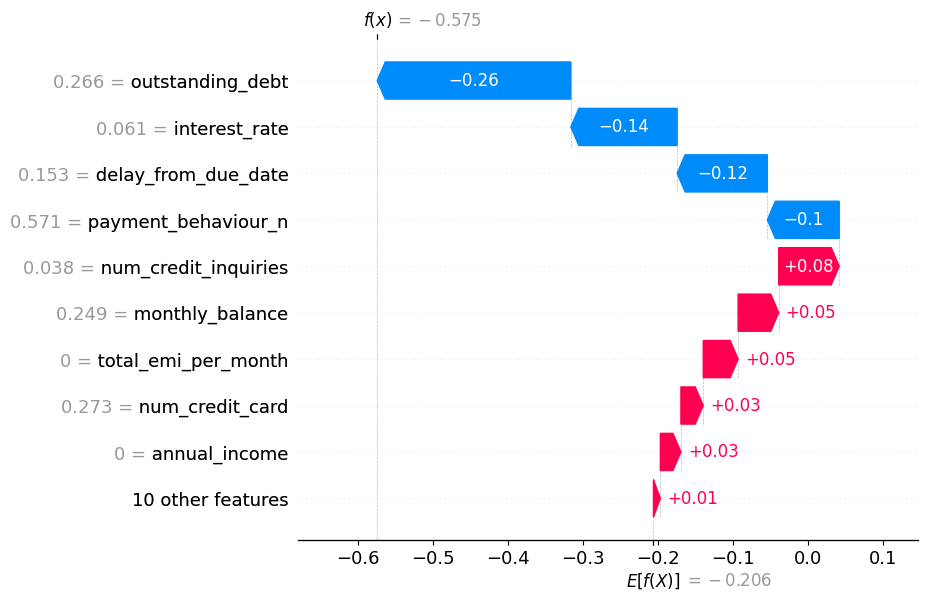

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 6355 Label: 0


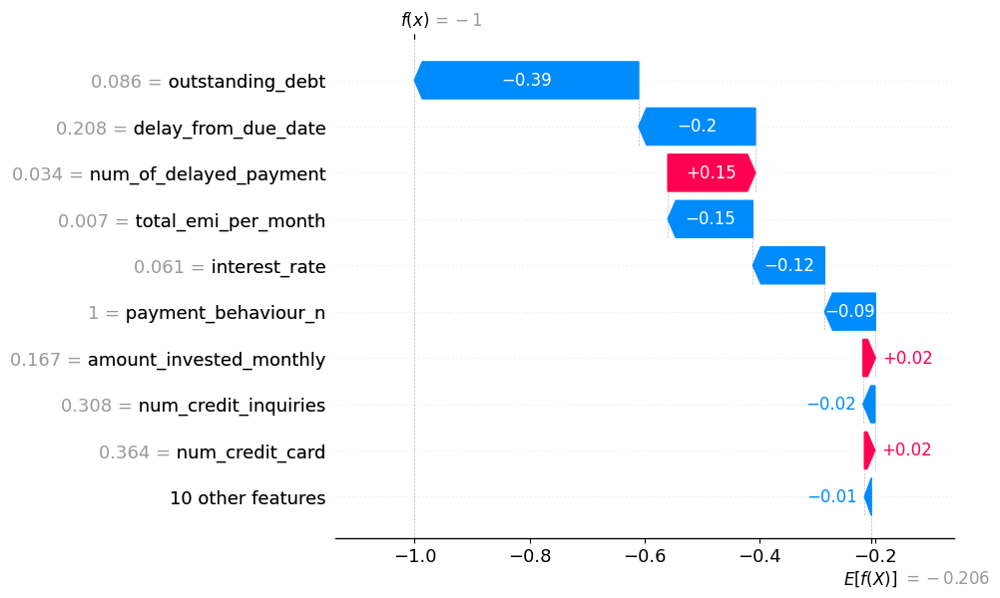

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 2403 Label: 0


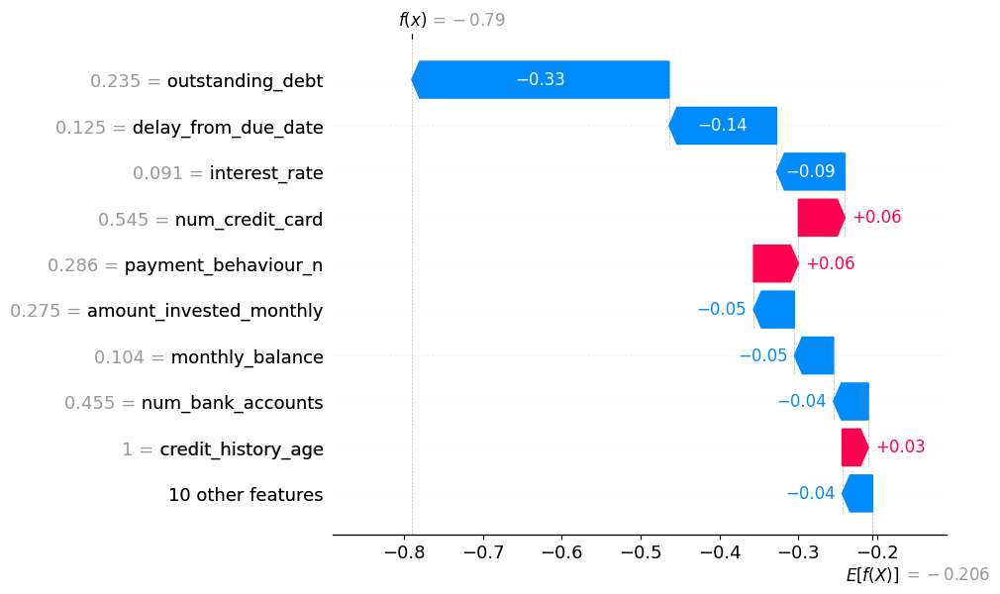

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 5117 Label: 0


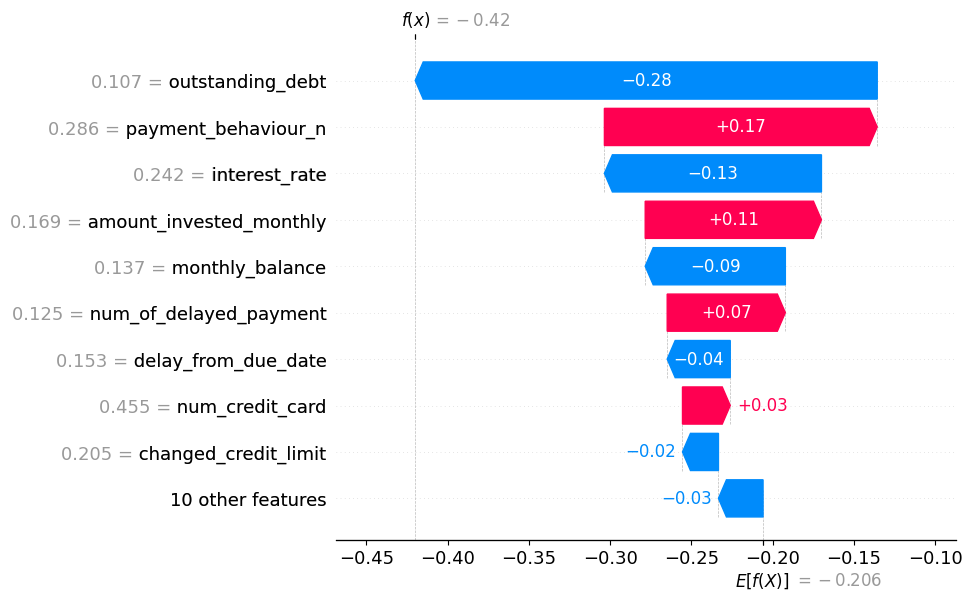

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 482 Label: 1


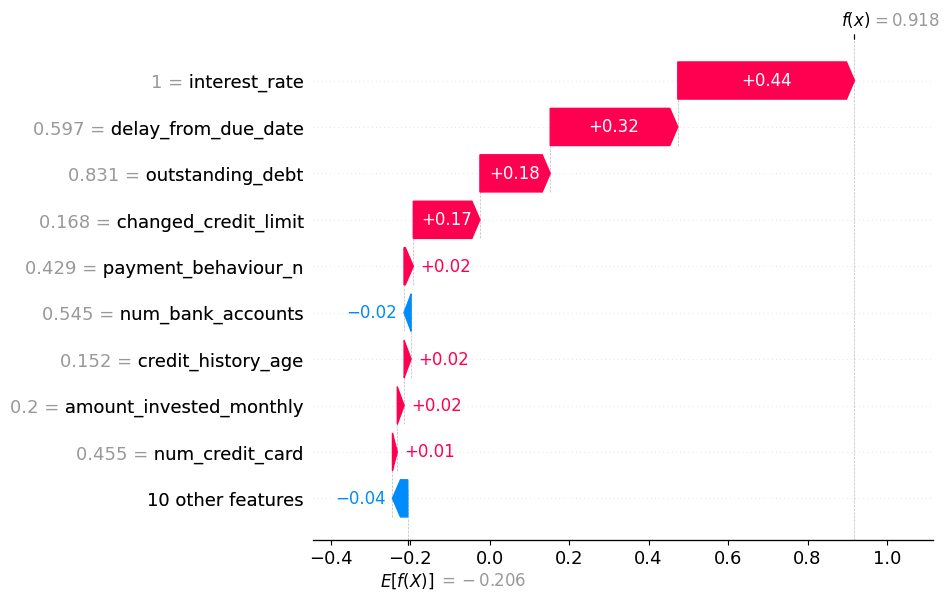

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 3028 Label: 1


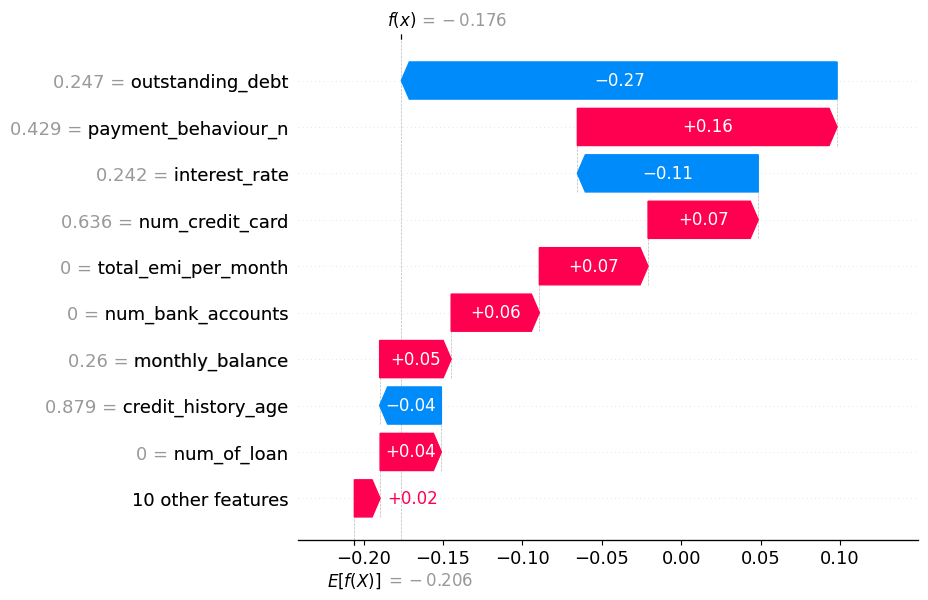

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

Sample: 5171 Label: 0


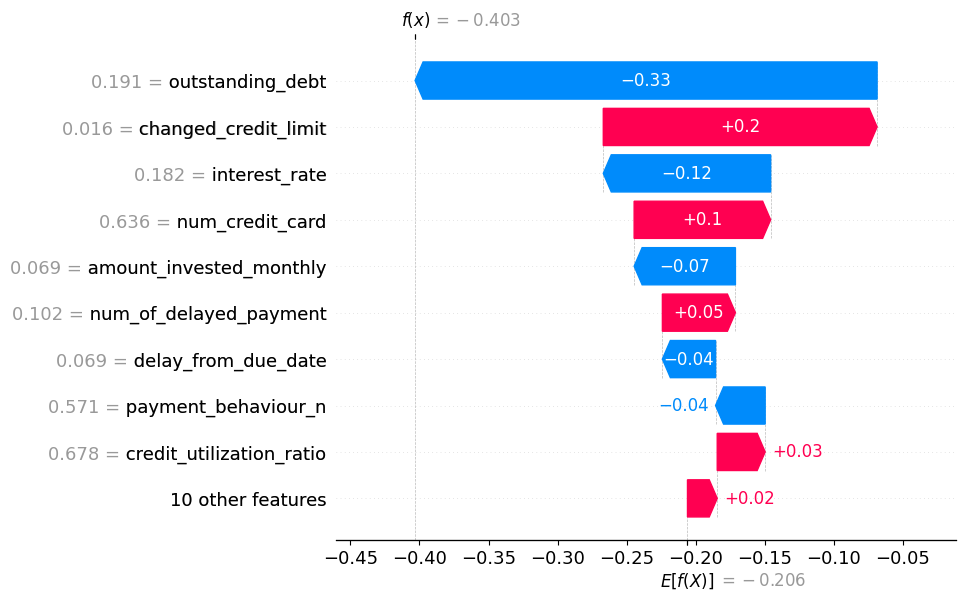

In [ ]:
idx=np.random.randint(len(X))
print('Sample:', idx, 'Label:', dfc.credit_score.iloc[idx])
shap.plots.waterfall(shap_values[idx,:,1])

In [ ]:
clf.predict(X.iloc[[2305, 635, 4737, 2556, 4024, 3895, 2111, 5647, 3612, 497]])

array([0, 0, 0, 1, 1, 0, 0, 1, 1, 0])

### Relación entre variables

Por último se analizó la correlación entre algunos pares de atributos respecto a su influencia en la clasificación. Para 'outstanding_debt' se pueden distinguir 3 clusters en relación a su shap value, notando que los valores menores de 'interest_rate' se concentran principalmente en el cluster de menor 'outstanding_debt' y shap value. Se observa que a partir de cierto punto el atributo 'delay_from_due_date' sólo tiene shap values positivos y comienza a haber mayor presencia de valores altos de 'num_of_delayed_payment'. Para 'changed_credit_limit' se ve que, por sobre la mediana mayores valores de 'outstanding_debt' correlacionan a menor shap value, mientras que por de bajo de la mediana la correlación se invierte.

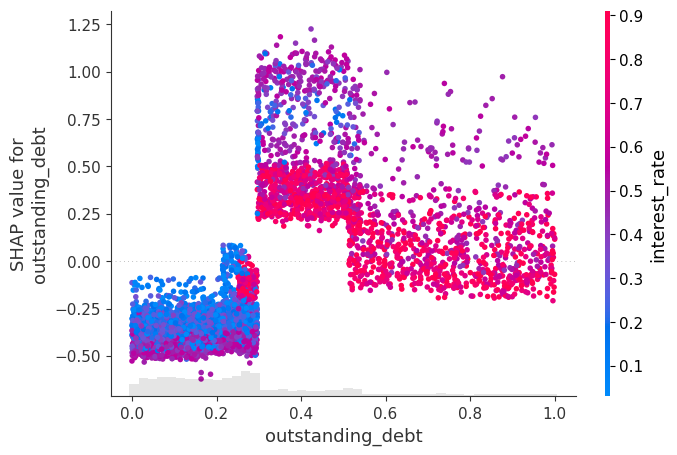

In [ ]:
shap.plots.scatter(shap_values[:,"outstanding_debt",1], color=shap_values[:,:,1])

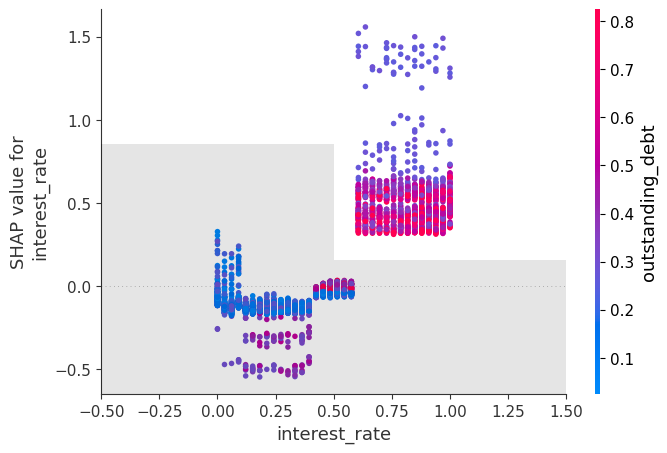

In [ ]:
shap.plots.scatter(shap_values[:,"interest_rate",1], color=shap_values[:,:,1])

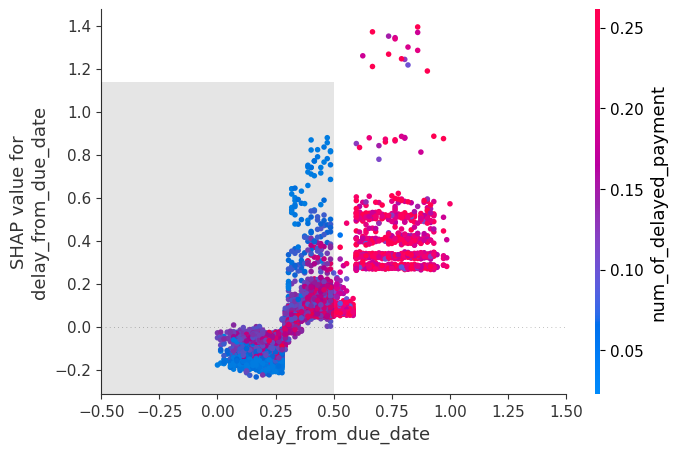

In [ ]:
shap.plots.scatter(shap_values[:,"delay_from_due_date",1], color=shap_values[:,:,1])

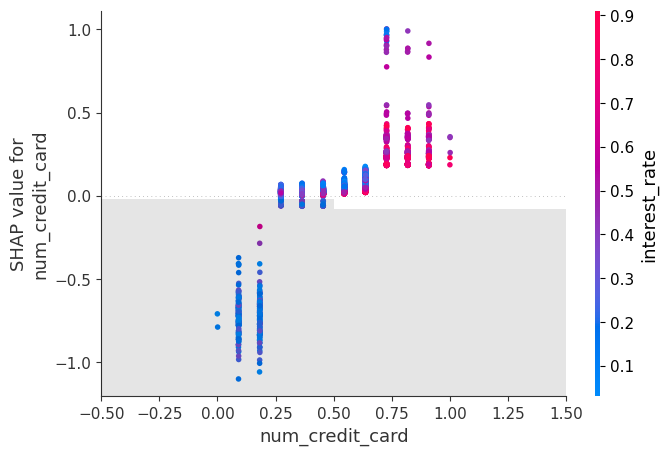

In [ ]:
shap.plots.scatter(shap_values[:,"num_credit_card",1], color=shap_values[:,:,1])

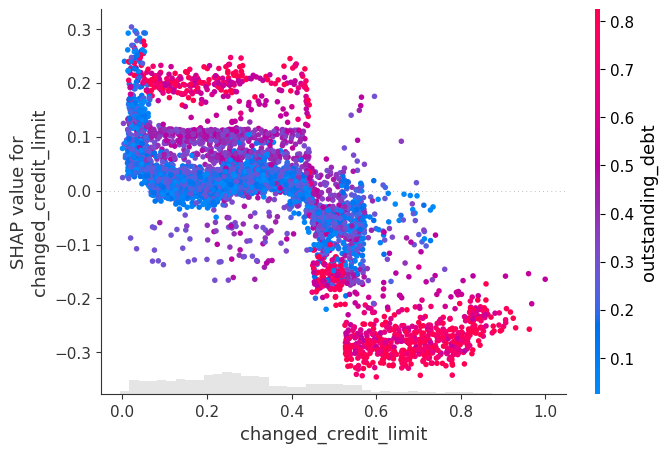

In [ ]:
shap.plots.scatter(shap_values[:,"changed_credit_limit",1], color=shap_values[:,:,1])

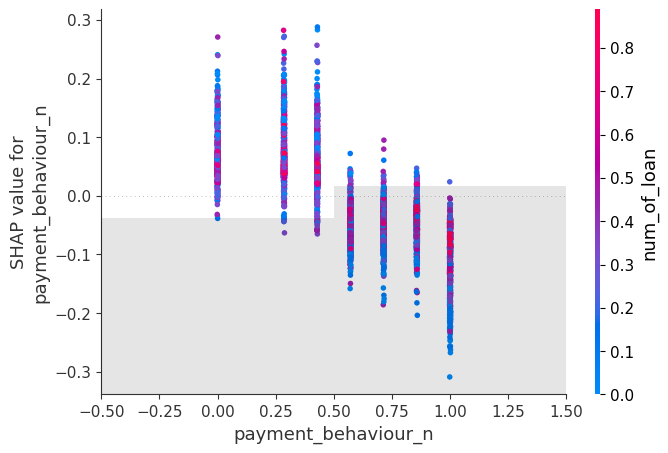

In [ ]:
shap.plots.scatter(shap_values[:,"payment_behaviour_n",1], color=shap_values[:,:,1])

## Conclusión

Informe de Resultados: Clasificación de Riesgo Crediticio

En este estudio, se abordó el desafío de desarrollar un modelo de clasificación que pueda predecir el riesgo crediticio de clientes utilizando una variedad de características financieras y de comportamiento. Nuestro conjunto de datos consistió en información detallada de 12,500 clientes junto con 22 variables relevantes para el análisis.

En el proceso de análisis exploratorio de datos (EDA), se llevó a cabo una inspección exhaustiva para comprender la distribución y relaciones entre las variables. Se detectaron valores faltantes en algunas instancias, y se aplicaron estrategias de eliminación de registros o imputación de valores para mitigar su impacto en el análisis. Además, se identificaron valores atípicos en ciertas variables, y para mantener la integridad del análisis, se optó por realizar un truncamiento adecuado.

Para establecer un punto de referencia en nuestro trabajo, implementamos un modelo de clasificación de referencia o baseline. En este caso, se aplicó la estrategia de clasificación aleatoria, donde las etiquetas se asignaron de manera aleatoria a las instancias. Los resultados mostraron que el f1-score obtenido para este baseline osciló entre 0.5 y 0.57, superando significativamente los resultados que se obtendrían con una clasificación completamente aleatoria (f1-score de 0.3). Estos hallazgos destacan la capacidad de los modelos para aprender del problema en cuestión, aunque aún no son suficientes para lograr una clasificación efectiva.

Con el objetivo de mejorar el rendimiento de los modelos, realizamos un proceso de ajuste de hiperparámetros mediante Grid Search en los mejores clasificadores evaluados inicialmente. Este procedimiento nos permitió lograr un ligero incremento en el rendimiento de los modelos.

El modelo que obtuvo el mejor rendimiento fue el Gradient Boosting Machine (GBM), que alcanzó un f1-score de 0.6 para la clase de alto riesgo crediticio. Aunque estos resultados superaron significativamente la clasificación aleatoria, aún no pueden considerarse como satisfactorios o ideales. Del análisis de interpretabilidad, se pudo concluir que existe algún criterio para la clasificación, que además tiene en cuenta la interacción entre las variables. Sin embargo, es importante mencionar que un f1-score de 0.6 se mantiene más cercano a una clasificación aleatoria que a la ideal.

En definitiva, si bien no se pudo resolver completamente el problema de clasificación de riesgo crediticio, no estamos disconformes con los resultados obtenidos. Es importante destacar que mejorar estos resultados requeriría un mayor esfuerzo y tiempo, lo que no estuvo disponible en el contexto de este estudio. Es probable que existan otras estrategias para abordar el problema, como la selección de características más relevantes, la exploración de diferentes métodos de pre-procesamiento de datos o el uso de modelos de clasificación más complejos.